# Settings

In [78]:
import numpy as np
import sys
import pandas as pd
import itertools

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from statsmodels.tsa.stattools import grangercausalitytests

import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.preprocessing import MinMaxScaler

import tigramite
import tigramite.data_processing as pp
import tigramite.plotting as tp
from tigramite.plotting import plot_time_series_graph

from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr import ParCorr
from tigramite.independence_tests.robust_parcorr import RobustParCorr

from tigramite.models import LinearMediation, Models
from tigramite.causal_effects import CausalEffects

import os

import pkg_resources

import cdsapi
import random
import zipfile

import netCDF4 as nc
import xarray as xr

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import nbformat

import seaborn as sns

from arch.unitroot import PhillipsPerron
from scipy import stats
from scipy.stats import gaussian_kde

import networkx as nx

from scipy.stats import pearsonr

import dagviz
from collections import Counter

from tqdm import tqdm

# Functions: Generating Dataset

## Generating a TVP-VAR(p) model

In [79]:
def CompanionFormMatrix(phi, seed=None):
    
    #if seed is not None:
    #    np.random.seed(seed)
    p = 1
    n = 4
    #n, _ = phi.shape # was: p, n, _
    C = np.zeros((n * p, n * p))

    # Fill in the Phi matrices
    for i in range(p):
        C[:n, i*n:(i+1)*n] = phi[i]

    # Fill in the identity matrices
    for i in range(1, p):
        C[i*n:(i+1)*n, (i-1)*n:i*n] = np.eye(n)
    
    # Check the eigenvalues
    eigenvalues = np.linalg.eigvals(C)
    abs_eigenvalues = np.abs(eigenvalues)
    score = 0
    for i in range(0,len(abs_eigenvalues)):
        if abs_eigenvalues[i] > 1:
                score += 1
    
    if score == 0:
        stability = True
        text = 'The system is stable'
    else:
        stability = False
        text = 'The system is not stable'        
        
    return C, stability, text, abs_eigenvalues

In [80]:
def Generate_Next_Phi(previous_phi, delta_min=0.00001, delta_max=0.001, seed=None):
    if seed is not None:
        np.random.seed(seed)
    print(f"TILLIE: input is previous_phi{previous_phi}, delta_min={delta_min}, delta_max={delta_max} and seed={seed}")
    p, n, _ = previous_phi.shape
    print(f"Tillie: p={p}, n={n}")
    stable_system = False
    while not stable_system:
        phi = previous_phi + np.random.uniform(delta_min, delta_max, previous_phi.shape)  #0.00001, 0.001
        for lag in range(p):
            np.fill_diagonal(phi[lag], np.diagonal(previous_phi[lag]))

        _, stable, _, eigenvalues = CompanionFormMatrix(phi, seed)
        if stable == True:
            print(f"Tillie we finally found one!")
            stable_system = True

    return phi, eigenvalues

In [81]:
def Generate_Error(phi, standard=True, seed=None):
    if seed is not None:
        np.random.seed(seed)

    T, _, n, _ = phi.shape

    if standard:
        Sigma = np.eye(n)
    else:
        Sigma = np.diag(np.random.uniform(-1, 1, n))
    
    epsilon = np.random.multivariate_normal(np.zeros(n), Sigma, T).T
    
    return epsilon, Sigma

In [82]:
def Generate_Constant(phi, constant=False, seed=None):
    if seed is not None:
        np.random.seed(seed)

    T, _, n, _ = phi.shape
    
    if constant:
        C = np.random.randn(n, T)
    else:
        C = np.zeros((n, T))
    
    return C

In [83]:
def Generate_Time_Series(phi, C, epsilon, seed=None):
    if seed is not None:
        np.random.seed(seed)

    T, p, n, _ = phi.shape
    Y = np.zeros((n, T))
    Y[:, :p] = np.random.uniform(30, 40, (n, p))

    for t in range(p, T):
        Y[:, t] = C[:, t - p]
        for j in range(1, p + 1):
            Y[:, t] += np.einsum('ij,j->i', phi[t][j-1], Y[:, t - j])
        Y[:, t] += epsilon[:, t - p]

    return Y

In [84]:
def Generate_TVP_VAR(p, T, s, d, initial_phi, initial_eigenvalues, standard=True, constant=False, delta_min=0.00001, delta_max=0.001, seed=None):
    """
    Generate a VAR model based on a phi matrix that changes throughout.
    p: number of lags (typically 1)
    T: number of time periods
    s: sparseness
    d: after how many time periods does it change? For example 12 if months and yearly change, or T/2 if only two different
    initial_phi: either generated or based on a dataset (non-random)
    initial_eigenvalues: corresponding to the input initial phi
    beta: the divergence from zero of the off-diagonal values in Phi        
    gamma: the divergence from one of the diagonal values in Phi
    delta_min: lower bound of what is added to phi when it changes
    delta_max: upper bound of what is added to phi when it changes
    beta=0.01, gamma=0.01, <-- taken out since we do not use it, we throw in our own phi
    """
    if seed is not None:
        np.random.seed(seed)
    
    n = 4
    #n, _ = initial_phi.shape
    print("TILLIE: begin generating dataset")
    Final_Phi = np.zeros((T, p, n, n))
    Final_Eigenvalues = []
    
    #initial_phi, initial_eigenvalues = Generate_Initial_Phi(n, p, s, beta=beta, gamma=gamma, seed=seed)
    Final_Phi[:d] = initial_phi
    Final_Eigenvalues.append(initial_eigenvalues)
    #print(f"We hebben een initial phi: {initial_phi}")
    print("TILLIE: we initialized phi")
    for t in range(d, T, d):
        print(f"TILLIE: phi run with t={t} where d={d} and T={T}. Last phi was: {Final_Phi[t-1]}. We try to generate with delta={delta_min},{delta_max} and seed={seed}")
        Next_Phi, eigenvalues = Generate_Next_Phi(Final_Phi[t-1], delta_min=delta_min, delta_max=delta_max, seed=seed)
        print("TILLIE: generated the next phi")
        #print(f"Loading... {np.round(t/T, decimals=2)*100}%")
        Final_Phi[t:t+d] = Next_Phi
        Final_Eigenvalues.append(eigenvalues)
    print("TILLIE: phi's generated, now onto the rest!")
    Epsilon, Sigma = Generate_Error(Final_Phi, standard=standard, seed=seed)
    #print(f"We hebben een error: {Epsilon}")
    C = Generate_Constant(Final_Phi, constant=constant, seed=seed)
    #print(f"We hebben een constant: {C}")
    Y = Generate_Time_Series(Final_Phi, C, Epsilon, seed=seed)
    
    return Y, Final_Phi, Sigma, Final_Eigenvalues

## Generate dataframe

In [85]:
def GenerateDF(data, start_year=1982, yearly=True, freq='ME', column_names=['WPAC','CPAC','EPAC','TW']):
    """
    This function generates a dataframe that we can use easily. 
    It will transpose the dataset so that we have rows of years and columns of variables, instead of the other way around.
    """
    
    # Make it a df and transpose the dataset (needed for Tigramite)
    df = pd.DataFrame(data)
    df = df.T
    
    if yearly == True:
        rows = list(range(2015-len(df), 2015))
    # Generate the names for the columns and rows
    #rows = list(range(start_year, start_year + df.shape[0]))  <--- yearly
    else:
        rows = pd.date_range(start=f'1982-01', periods=df.shape[0], freq=freq)  
        
    # Assign the names to the columns and rows
    df.index = rows
    df.columns = column_names
    
    # We will also be using a Tigramite df so let's return that as well
    # Note that a Tigramite dataframe needs to be of size Txn 
    dfT = pp.DataFrame(df.values, var_names=df.columns.tolist(), datatime=df.index.tolist())

    return df, dfT

## Generating an initial phi

For the Generate_TVP_VAR we need an input phi. This could be random or based on a val_matrix from PCMCI output. 

In [86]:
def Random_initial_phi(n, p, s, beta=0.01, gamma=0.01, seed=None):
    if seed is not None:
        np.random.seed(seed)

    stable_system = False
    while not stable_system:
        Phi = np.random.binomial(1, s, (p, n, n)).astype(float)

        for lag in range(p):
            off_diag_indices = np.where(np.eye(n) == 0)
            Phi[lag][off_diag_indices] = np.random.uniform(-beta, beta, size=off_diag_indices[0].size)
            np.fill_diagonal(Phi[lag], np.random.uniform(1 - gamma, 1 + gamma, size=n))

        _, stable, _, eigenvalues = CompanionFormMatrix(Phi, seed)
        if stable:
            stable_system = True
    print("TILLIE: random_initial_phi")
    return Phi, eigenvalues

In [87]:
def Non_random_initial_phi(val_matrix):
    "Construct a Phi Matrix for the pcmci option based on an input val_matrix"
    n, _, _ = val_matrix.shape # Or just fill in 4
    Phi = np.zeros((n,n))
    for i in range(0,n): 
        for j in range(0,n): 
            Phi[i,j] = val_matrix[j,i,1]
        
    _, stable, _, eigenvalues = CompanionFormMatrix(Phi)
    
    if not stable:
        print("Note that the generated phi is not stable")
              
    return Phi, eigenvalues

# Function: Detrending and deseazonalizing

In [88]:
def deTrend_deSeasonalize(data, period=12, show_plot = False):
    # step 1: seasonal component
    decomposition = seasonal_decompose(data, model='additive', period=period) # 1 for annual, 12 for monthly, 52 for weekly and 365 for daily
    data = data - decomposition.seasonal
    # step 2: Trend based on Gaussian kernel smoother
    #smoothed = pp.smooth(np.copy(data), smooth_width=15 * 12, residuals=False)
    index = range(0, len(data))

    if show_plot == True:
        plt.plot(index, data)
        #plt.plot(index,smoothed)
        plt.legend(['data', 'Smoothed trend'])
        plt.title("Deseasonalized data with smoothed trend")
        plt.show()

    else:
        result = data #- smoothed
        return result

# Functions: PCMCI

In [89]:
def deTrend_deSeazonalize_pcmci(df, period=12):
    
    wpac_detrend = deTrend_deSeasonalize(df['WPAC'], period=12, show_plot = False)
    cpac_detrend = deTrend_deSeasonalize(df['CPAC'], period=12, show_plot = False)
    epac_detrend = deTrend_deSeasonalize(df['EPAC'], period=12, show_plot = False)
    tw_detrend = deTrend_deSeasonalize(df['TW'], period=12, show_plot = False)
    
    df_processed = pd.DataFrame({'WPAC': wpac_detrend, 'CPAC': cpac_detrend, 'EPAC': epac_detrend, 'TW': tw_detrend})
    
    return df_processed

In [90]:
def Run_PCMCI(df, parcorr, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'model', plot=True):
    
    df_processed = deTrend_deSeazonalize_pcmci(df)
    
    # Construct mask for spring barrier
    cycle_length = 12
    springbarrier_mask = np.ones(df_processed.shape, dtype=bool)
    for i in [4, 5, 6, 7, 8, 9, 10, 11, 0]:
        springbarrier_mask[i::cycle_length, :] = False
        
    dfT = pp.DataFrame(np.copy(df_processed), datatime = {0:np.arange(len(df_processed))}, var_names= var_names, mask = springbarrier_mask)
    pcmci = PCMCI(dataframe=dfT, cond_ind_test=parcorr, verbosity=0)
    results = pcmci.run_pcmci(tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, fdr_method = 'fdr_bh')
    
    if plot==True:
        tp.plot_graph(
            val_matrix=results['val_matrix'],
            graph=results['graph'],
            var_names=var_names,
            link_colorbar_label='cross-MCI',
            node_colorbar_label='auto-MCI')
        plt.title(f'Causal networks based on {model} data', fontsize = 18)
        plt.show()
    
    return results

In [91]:
parcorr = ParCorr(significance='analytic', mask_type='y')
parcorr_nomask = ParCorr(significance='analytic')
parcorr_conf = ParCorr(significance='analytic', mask_type='y', confidence='analytic', conf_lev=0.9, conf_samples=100)

# Functions: Splits

In [92]:
def SplitDF(df, cuts):
    """
    Split the dataframe into even cuts so we can compare them later.
    cuts: the number of cuts
    """
    if len(df) % cuts != 0:
        raise ValueError("The length of the dataframe is not evenly divisible by the number of cuts.")
    # Calculate split size
    split_df = len(df) // cuts
    # And cut it accordingly
    df_splits = [df.iloc[i*split_df:(i+1)*split_df] for i in range(cuts)]
    return df_splits

In [93]:
def SplitPhi(phi, cuts):
    """
    Split the phi matrix into even cuts so we can compare them later.
    cuts: the number of cuts
    """
    if phi.shape[0] % cuts != 0:
        raise ValueError("The first dimension of phi is not evenly divisible by the number of cuts.")
    # Calculate split size
    split_phi = phi.shape[0] // cuts
    # And cut it accordingly
    phi_splits = [phi[i*split_phi:(i+1)*split_phi] for i in range(cuts)]
    return phi_splits

# Functions: Plotting

In [94]:
def Plot_Simulated_Data(df, model_name = ''):
    fig = px.line(df, x=df.index, y=df.columns, title=f'Time Series Plot of Variables - {model_name}')
    fig.show()
    fig = go.Figure()
    for column in df.columns:
        fig.add_trace(go.Histogram(x=df[column], name=column, opacity=0.75))
    fig.update_layout(
        barmode='overlay',
        title=f'Distribution of Variables - {model_name}',
        xaxis_title='Value',
        yaxis_title='Count',
        legend_title='Variable',
        width=2400,
        height=1600
    )
    fig.show()

In [95]:
def Plot_Simulated_Data_Seaborne(df, model_name=''):
    # Time Series Plot
    plt.figure(figsize=(24, 16))
    for column in df.columns:
        sns.lineplot(x=df.index, y=df[column], label=column)    
    plt.title(f'Time Series Plot of Variables - {model_name}')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.legend(prop={'size': 30})  
    plt.tight_layout()
    plt.show()

    # Distribution Plot
    plt.figure(figsize=(24, 16))
    for column in df.columns:
        sns.histplot(df[column], kde=True, alpha=0.5, label=column)
    plt.title(f'Distribution of Variables - {model_name}')
    plt.xlabel('Value')
    plt.ylabel('Count')
    plt.legend(prop={'size': 30}) 
    plt.tight_layout()
    plt.show()


In [96]:
def GenerateShades(base_color, num_shades):
    """
    Generate lighter shades of a base color.
    """
    base_rgb = mcolors.to_rgb(base_color)
    shades = [mcolors.to_hex([base_rgb[j] + (1 - base_rgb[j]) * i / (num_shades + 1) for j in range(3)]) for i in range(1, num_shades + 1)]
    return shades

In [97]:
def GenerateColors(num_colors, colormap):
    """
    Generate a list of distinct colors.
    """
    cmap = plt.cm.get_cmap(colormap, num_colors) #'viridis'
    #cmap = plt.colormaps['viridis'] 
    colors = [mcolors.to_hex(cmap(i)) for i in range(num_colors)]
    return colors

In [98]:
def PlotSplitDFs(split_dfs, colormap_matplotlib='viridis'):
    """
    Plots the given list of split dataframes with different colors for each variable.
    """
    fig = go.Figure()

    # Base colors for different sub-dataframes (according to number of splits)
    num_splits = len(split_dfs)
    base_colors = GenerateColors(num_splits, colormap_matplotlib)

    # Number of variables so we know how many shades we need in generate_shades
    num_vars = len(split_dfs[0].columns)

    # Generate shades for each base color
    color_map = {color: GenerateShades(color, num_vars) for color in base_colors}

    # Iterate over each sub-dataframe and add traces for each column
    for i, df in enumerate(split_dfs):
        for j, col in enumerate(df.columns):
            fig.add_trace(go.Scatter(
                x=df.index,
                y=df[col],
                mode='lines',
                name=f'{col} - Split {i+1}',
                line=dict(color=color_map[base_colors[i]][j])
            ))

    fig.update_layout(
        title='Time Series Splits of DataFrame',
        xaxis_title='Time',
        yaxis_title='Values',
        margin=dict(l=140),
        yaxis=dict(
            title_standoff=10,
            automargin=True
        )
    )

    fig.show()

In [99]:
def PlotSplitDFs_Seaborne(split_dfs, colormap_matplotlib='viridis'):
    """
    Plots the given list of split dataframes with different colors for each variable.
    """
    # Generate base colors for different sub-dataframes
    num_splits = len(split_dfs)
    base_colors = GenerateColors(num_splits, colormap_matplotlib)

    # Number of variables so we know how many shades we need
    num_vars = len(split_dfs[0].columns)

    # Generate shades for each base color
    color_map = {i: GenerateShades(base_colors[i], num_vars) for i in range(num_splits)}

    # Plotting
    plt.figure(figsize=(14, 8))

    for i, df in enumerate(split_dfs):
        for j, col in enumerate(df.columns):
            plt.plot(df.index, df[col], label=f'{col} - Split {i+1}', color=color_map[i][j])

    plt.title('Time Series Splits of DataFrame')
    plt.xlabel('Time')
    plt.ylabel('Values')
    #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')
    plt.legend(loc='best', fontsize='large')  
    plt.tight_layout()
    plt.show()

# Functions: Strengthening links?

Emma used 5 cases: early absence, late absence, no change, increase and decrease. However, absence is whenever the value in the val_matrix is close to 0. Therefore, we could just as well only distinguish increase, decrease and no change.

"We consider a change in link strength as significant when the value of the later time period lies outside the significance interval of the early time period."

In [100]:
def CheckLinkStrengthening(early_val_matrix, early_conf_matrix, late_val_matrix):
    
    n, _, _ = early_val_matrix.shape # Or just fill in 4
    
    decrease = 0
    significant_decrease = 0
    increase = 0
    significant_increase = 0
    other = 0
    
    for i in range(0,n): 
        for j in range(0,n): 
            before = early_val_matrix[j,i,1]
            after = late_val_matrix[j,i,1]
            if before > after:
                decrease += 1
                if after < early_conf_matrix[j,i,1,0]:
                    significant_decrease += 1
            elif before < after: 
                increase += 1
                if after > early_conf_matrix[j,i,1,1]:
                    significant_increase += 1
            else: 
                other += 1
    
    return significant_increase, significant_decrease, increase, decrease, other

In [101]:
def CheckLinkStrengtheningDiagonals(early_val_matrix, early_conf_matrix, late_val_matrix):
    
    n, _, _ = early_val_matrix.shape # Or just fill in 4
    
    decrease = 0
    significant_decrease = 0
    significant_decrease_diagonal = 0
    increase = 0
    significant_increase = 0
    significant_increase_diagonal = 0
    other = 0
    
    for i in range(0,n): 
        for j in range(0,n): 
            before = early_val_matrix[j,i,1]
            after = late_val_matrix[j,i,1]
            if before > after:
                decrease += 1
                if after < early_conf_matrix[j,i,1,0]:
                    significant_decrease += 1
                    if j == i:
                        significant_increase_diagonal += 1
            elif before < after: 
                increase += 1
                if after > early_conf_matrix[j,i,1,1]:
                    significant_increase += 1
                    if j == i:
                        significant_decrease_diagonal += 1
            else: 
                other += 1
    
    return significant_increase, significant_decrease, increase, decrease, other, significant_increase_diagonal, significant_decrease_diagonal

We can use this to check a certain dataset, given the results for the early and late period (so after splitting the dataset and running pcmci for both periods). However, we could also make it a test, by generating M datasets either based on a certain phi matrix or completely random, splitting the generated data and then run pcmci on both periods to check the splitting. For this we will make a function that will calculate the mean statistics when inputting a phi matrix on which the dataset will be based. 

In [102]:
def CheckLinkStrengthening_RunPCMCI(df_first_period, df_second_period, test, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = '', plot_dag=True):
    """
    We will input the split dataframes and run PCMCI so we can calculate the statistics.
    test: use parcorr_conf whenever not sure whether it will calculate the conf
    plot_dag: whether or not to plot the DAG
    """
    
    results_period1 = Run_PCMCI(df_first_period, test, tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, var_names = var_names, model = f'{model} - First Period', plot=plot_dag)
    results_period2 = Run_PCMCI(df_second_period, test, tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, var_names = var_names, model = f'{model} - Second Period', plot=plot_dag)
    
    significant_increase, significant_decrease, increase, decrease, other = CheckLinkStrengthening(results_period1['val_matrix'], results_period1['conf_matrix'], results_period2['val_matrix'])
    
    return significant_increase, significant_decrease, increase, decrease, other

In [103]:
def CheckLinkStrengthening_RunPCMCI_Diagonals(df_first_period, df_second_period, test, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = '', plot_dag=True):
    """
    We will input the split dataframes and run PCMCI so we can calculate the statistics.
    test: use parcorr_conf whenever not sure whether it will calculate the conf
    plot_dag: whether or not to plot the DAG
    """
    
    results_period1 = Run_PCMCI(df_first_period, test, tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, var_names = var_names, model = f'{model} - First Period', plot=plot_dag)
    results_period2 = Run_PCMCI(df_second_period, test, tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, var_names = var_names, model = f'{model} - Second Period', plot=plot_dag)
    
    significant_increase, significant_decrease, increase, decrease, other, significant_increase_diagonal, significant_decrease_diagonal = CheckLinkStrengtheningDiagonals(results_period1['val_matrix'], results_period1['conf_matrix'], results_period2['val_matrix'])
    
    return significant_increase, significant_decrease, increase, decrease, other, significant_increase_diagonal, significant_decrease_diagonal

In [104]:
def CheckLinkStrengthening_RunPCMCI_GenerateData(phi, eigenvalues, test, p=1, T=864, s=0.6, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=True, plot_splits_graph=True, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=True, seed=None):
    """
    new_phi is generated becasuse if you make a changing phi, you need the whole matrix containing multiple phi's. When T = d then phi is just the same as new_phi.
    (delta_min=0.00001, delta_max=0.001) is also a nice possibility
    """
    
    data, new_phi, _, _ = Generate_TVP_VAR(p, T, s, d, phi, eigenvalues, standard=standard, constant=constant, delta_min=delta_min, delta_max=delta_max, seed=seed)
    df, _ = GenerateDF(data, start_year=start_year)
    if plot_data_graph == True:
         Plot_Simulated_Data(df, model_name = model)
    
    df_split = SplitDF(df, cuts)
    
    if plot_splits_graph == True:
        PlotSplitDFs(df_split)
    
    significant_increase, significant_decrease, increase, decrease, other = CheckLinkStrengthening_RunPCMCI(df_split[0], df_split[1], test, 
                                                                                                            tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, 
                                                                                                            alpha_level=alpha_level, var_names = var_names, 
                                                                                                            model = model, plot_dag=plot_dag)
    
    return significant_increase, significant_decrease, increase, decrease, other

In [105]:
def CheckLinkStrengthening_RunPCMCI_GenerateData_Diagonals(phi, eigenvalues, test, p=1, T=864, s=0.6, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=True, plot_splits_graph=True, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=True, seed=None):
    """
    new_phi is generated becasuse if you make a changing phi, you need the whole matrix containing multiple phi's. When T = d then phi is just the same as new_phi.
    (delta_min=0.00001, delta_max=0.001) is also a nice possibility
    """
    
    data, new_phi, _, _ = Generate_TVP_VAR(p, T+100, s, d, phi, eigenvalues, standard=standard, constant=constant, delta_min=delta_min, delta_max=delta_max, seed=seed)
    df_full, _ = GenerateDF(data, start_year=start_year)
    df = df_full[:100]
    
    if plot_data_graph == True:
         Plot_Simulated_Data(df, model_name = model)
    
    df_split = SplitDF(df, cuts)
    
    if plot_splits_graph == True:
        PlotSplitDFs(df_split)
    
    significant_increase, significant_decrease, increase, decrease, other, significant_increase_diagonal, significant_decrease_diagonal = CheckLinkStrengthening_RunPCMCI_Diagonals(df_split[0], df_split[1], test, 
                                                                                                            tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, 
                                                                                                            alpha_level=alpha_level, var_names = var_names, 
                                                                                                            model = model, plot_dag=plot_dag)
    
    return significant_increase, significant_decrease, increase, decrease, other, significant_increase_diagonal, significant_decrease_diagonal

In [106]:
def CheckLinkStrengthening_RandomPhi_MC(M, s, test, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=None):
    """
    We generate a random phi, then base our dataset on this, split the dataframe, run pcmci and compare the outcomes. 
    Then we count the amount of times that there is a more significant increase than decrease.
    """

    results_dict = {
    'seed': [],
    'significant_increase': [],
    'significant_decrease': [],
    'increase': [],
    'decrease': [],
    'other': []}
    
    for m in tqdm(range(M), desc="Running simulations"):
        phi, eigenvalues = Random_initial_phi(n, p, s, beta=beta, gamma=gamma, seed=seed)
        significant_increase, significant_decrease, increase, decrease, other = CheckLinkStrengthening_RunPCMCI_GenerateData(phi, eigenvalues, test, p=p, T=T, s=s, 
                                                                                                                             d=d, cuts=cuts, standard=standard, constant=constant, 
                                                                                                                             delta_min=delta_min, delta_max=delta_max, 
                                                  start_year=start_year, plot_data_graph=plot_data_graph, plot_splits_graph=plot_splits_graph, model=model, tau_max=tau_max, 
                                                                                                                             tau_min=tau_min, pc_alpha=pc_alpha, 
                                                  alpha_level=alpha_level, var_names = var_names, plot_dag=plot_dag, seed=seed)
                
        results_dict['seed'].append(seed)
        results_dict['significant_increase'].append(significant_increase)
        results_dict['significant_decrease'].append(significant_decrease)
        results_dict['increase'].append(increase)
        results_dict['decrease'].append(decrease)
        results_dict['other'].append(other)
        
        if seed is not None:
            seed += 1
    
    return results_dict


In [108]:
def CheckLinkStrengthening_RandomPhi_MC_Diagonal(M, s, test, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=None):
    """
    We generate a random phi, then base our dataset on this, split the dataframe, run pcmci and compare the outcomes. 
    Then we count the amount of times that there is a more significant increase than decrease.
    """

    results_dict = {
    'seed': [],
    'significant_increase': [],
    'significant_decrease': [],
    'increase': [],
    'decrease': [],
    'other': [],
    'significant_increase_diagonal': [],
    'significant_decrease_diagonal': []}
    
    for m in tqdm(range(M), desc="Running simulations"):
        phi, eigenvalues = Random_initial_phi(n, p, s, beta=beta, gamma=gamma, seed=seed)
        significant_increase, significant_decrease, increase, decrease, other, significant_increase_diagonal, significant_decrease_diagonal = CheckLinkStrengthening_RunPCMCI_GenerateData_Diagonals(phi, eigenvalues, test, p=p, T=T, s=s, 
                                                                                                                             d=d, cuts=cuts, standard=standard, constant=constant, 
                                                                                                                             delta_min=delta_min, delta_max=delta_max, 
                                                  start_year=start_year, plot_data_graph=plot_data_graph, plot_splits_graph=plot_splits_graph, model=model, tau_max=tau_max, 
                                                                                                                             tau_min=tau_min, pc_alpha=pc_alpha, 
                                                  alpha_level=alpha_level, var_names = var_names, plot_dag=plot_dag, seed=seed)
                
        results_dict['seed'].append(seed)
        results_dict['significant_increase'].append(significant_increase)
        results_dict['significant_decrease'].append(significant_decrease)
        results_dict['increase'].append(increase)
        results_dict['decrease'].append(decrease)
        results_dict['other'].append(other)
        results_dict['significant_increase_diagonal'].append(significant_increase_diagonal)
        results_dict['significant_decrease_diagonal'].append(significant_decrease_diagonal)
        
        if seed is not None:
            seed += 1
    
    return results_dict


SyntaxError: invalid syntax (33492753.py, line 21)

In [ ]:
def MeanLinkStrengthening(results_dictionary, print_means=True):
    """
    Calculate the means of the results dictionary (which has all the results for M runs of calculating the link strengthening statistics.
    """
    
    mean_significant_increase = np.mean(results_dictionary['significant_increase'])
    mean_significant_decrease = np.mean(results_dictionary['significant_decrease'])
    mean_increase = np.mean(results_dictionary['increase'])
    mean_decrease = np.mean(results_dictionary['decrease'])
    mean_other = np.mean(results_dictionary['other'])
    
    if print_means == True:
        print("Mean Significant Increase:", mean_significant_increase)
        print("Mean Significant Decrease:", mean_significant_decrease)
        print("Mean Increase:", mean_increase)
        print("Mean Decrease:", mean_decrease)
        print("Mean Other:", mean_other)
    
    return mean_significant_increase, mean_significant_decrease, mean_increase, mean_decrease, mean_other

In [ ]:
def CountLinkStrengthening(results_dictionary, delta=1, print_count=True):
    
    M = len(results_dictionary['significant_increase'])
    
    #strengthening = sum(np.array(results_dictionary['significant_increase']) > (np.array(results_dictionary['significant_decrease']) + delta))
    # Perform element-wise comparison to get a boolean array
    comparison = np.array(results_dictionary['significant_increase']) > (np.array(results_dictionary['significant_decrease']) + delta)
    strengthening = sum(comparison)
    strengtening_percentage = (strengthening / M) * 100
    
    strengthening_seeds = [seed for seed, comp in zip(results_dictionary['seed'], comparison) if comp]
    
    if print_count == True:
        print("% of simulations where there were more significantly increasing links than significantly decreasing:", strengtening_percentage)
    
    return strengtening_percentage, strengthening_seeds

In [ ]:
def CountLinkStrengthening_MinusDiagonal(results_dictionary, delta=1, print_count=True):
    
    M = len(results_dictionary['significant_increase'])
    
    #strengthening = sum(np.array(results_dictionary['significant_increase']) > (np.array(results_dictionary['significant_decrease']) + delta))
    # Perform element-wise comparison to get a boolean array
    comparison = np.array(results_dictionary['significant_increase']) > (np.array(results_dictionary['significant_decrease']) + delta)
    strengthening = sum(comparison)
    strengtening_percentage = (strengthening / M) * 100
    
    comparison_minus_diagonal = (np.array(results_dictionary['significant_increase'])-np.array(results_dictionary['significant_increase_diagonal'])) > ((np.array(results_dictionary['significant_decrease']) - np.array(results_dictionary['significant_decrease_diagonal'])) + delta)
    strengthening_minus_diagonal = sum(comparison_minus_diagonal)
    strengtening_percentage_minus_diagonal = (strengthening_minus_diagonal / M) * 100
    
    strengthening_seeds = [seed for seed, comp in zip(results_dictionary['seed'], comparison) if comp]
    strengthening_seeds = [seed for seed, comp in zip(results_dictionary['seed'], comparison_minus_diagonal) if comp]

    if print_count == True:
        print("% of simulations where there were more significantly increasing links than significantly decreasing:", strengtening_percentage)
        print("% of simulations where there were more significantly increasing links than significantly decreasing MINUS diagonal:", strengtening_percentage_minus_diagonal)

    return strengtening_percentage, strengtening_percentage_minus_diagonal, strengthening_seeds, comparison_minus_diagonal

# Functions: Strengthening links - multiple cuts?

In [ ]:
def CheckLinkStrengthening_RunPCMCI_GenerateData_MoreCuts(phi, eigenvalues, test, p=1, T=864, s=0.6, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=True, plot_splits_graph=True, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=True, seed=None):
    """
    We redefine the function so that we can run it for multiple cuts!
    new_phi is generated becasuse if you make a changing phi, you need the whole matrix containing multiple phi's. When T = d then phi is just the same as new_phi.
    (delta_min=0.00001, delta_max=0.001) is also a nice possibility
    """
    
    # Generate the dataset and dataframe
    data, new_phi, _, _ = Generate_TVP_VAR(p, T, s, d, phi, eigenvalues, standard=standard, constant=constant, delta_min=delta_min, delta_max=delta_max, seed=seed)
    df, _ = GenerateDF(data, start_year=start_year)
    if plot_data_graph == True:
         Plot_Simulated_Data(df, model_name = model)
    print("TILLIE: generated a dataframe!")
    # Split it into even cuts (make sure that T is divisible by the nuumber of cuts, generating an integer number of cuts)
    df_split = SplitDF(df, cuts)
    
    if plot_splits_graph == True:
        PlotSplitDFs(df_split)  
    
    results = {
        'significant_increase': [],
        'significant_decrease': [],
        'increase': [],
        'decrease': [],
        'other': []
    }
    
    for i in range(cuts - 1):
        sig_inc, sig_dec, inc, dec, oth = CheckLinkStrengthening_RunPCMCI(df_split[i], df_split[i+1], test, 
                                                                          tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, 
                                                                          alpha_level=alpha_level, var_names=var_names, 
                                                                          model=model, plot_dag=plot_dag)
        results['significant_increase'].append(sig_inc)
        results['significant_decrease'].append(sig_dec)
        results['increase'].append(inc)
        results['decrease'].append(dec)
        results['other'].append(oth)
    
    return results    

In [ ]:
def ResultsChecking_MoreCuts(results_dictionary, delta, min_tp, max_tp):
    """
    min_tp is the minimum of time periods we should have in the total number time periods for a boolean to be able to be true
    max_tp is the maximum of time periods we may have in the total number time periods for the other boolean to be able to be true
    """
    
    significant_increase_list = []
    significant_decrease_list = []
    other_list = []
    
    # Check for every time period, if that time period had more significantly increasing links, more significantly decreasing links, or other
    for i in range(len(results_dictionary['significant_increase'])):
        sig_inc = results_dictionary['significant_increase'][i]
        sig_dec = results_dictionary['significant_decrease'][i]
        
        if sig_inc > (sig_dec + delta):
            significant_increase_list.append(i)
        elif sig_dec > (sig_inc + delta):
            significant_decrease_list.append(i)
        else:
            other_list.append(i)
    
    significant_decrease = 0
    significant_increase = 0
    other = 0
    # Now say we consider a time series to be constantly increasing (decreasing) when there are only max_tp that are decreasing (increasing)
    # Then we know it is not true if there are more than max_tp and also there are at least min_tp periods of growth
    # FOR EXAMPLE: if now we have 4 time periods and max_tp = 1, min_tp = 3 and we see 3 periods of growth and 1 period of declining
    # Then it would count the length of significant_decrease_list <= max_tp and significant_increase_list => min_tp
    # SO then we get that significant_increase = 1
    if len(significant_increase_list) <= max_tp and len(significant_decrease_list) >= min_tp:
        significant_decrease += 1
    elif len(significant_decrease_list) <= max_tp and len(significant_increase_list) >= min_tp:
        significant_increase += 1
    else:
        other += 1
    
    print("TILLIE: checked results!")
    return significant_increase, significant_decrease, other

In [ ]:
def CheckLinkStrengthening_RandomPhi_MC_MoreCuts(M, s, test, min_tp, max_tp, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=None):
    """
    We generate a random phi, then base our dataset on this, split the dataframe, run pcmci and compare the outcomes. 
    Then we count the amount of times that there is a more significant increase than decrease.
    """

    results_dict = {
    'seed': [],
    'significant_increase': [],
    'significant_decrease': [],
    'other': []}
    
    for m in tqdm(range(M), desc="Running simulations"):
        phi, eigenvalues = Random_initial_phi(n, p, s, beta=beta, gamma=gamma, seed=seed)
        results_linkcheck_pcmci = CheckLinkStrengthening_RunPCMCI_GenerateData_MoreCuts(phi, eigenvalues, test, p=p, T=T, s=s, 
                                                                                                                             d=d, cuts=cuts, standard=standard, constant=constant, 
                                                                                                                             delta_min=delta_min, delta_max=delta_max, 
                                                  start_year=start_year, plot_data_graph=plot_data_graph, plot_splits_graph=plot_splits_graph, model=model, tau_max=tau_max, 
                                                                                                                             tau_min=tau_min, pc_alpha=pc_alpha, 
                                                  alpha_level=alpha_level, var_names = var_names, plot_dag=plot_dag, seed=seed)
        
        # Now test the outcome results dictionary to see whether it has significantly increasing, decreasing or other links.
        significant_increase_boolean, significant_decrease_boolean, other_boolean = ResultsChecking_MoreCuts(results_linkcheck_pcmci, delta, min_tp, max_tp)
        # And assign this to the results_dict that will eventually be our output.
        results_dict['seed'].append(seed)
        results_dict['significant_increase'].append(significant_increase_boolean)
        results_dict['significant_decrease'].append(significant_decrease_boolean)
        results_dict['other'].append(other_boolean)
        
        if seed is not None:
            seed += 1
    
    return results_dict

In [ ]:
def CountLinkStrengthening_MoreCuts(results_dictionary, cuts, min_tp, max_tp, print_count=True):
    """
    Since the results dictionary will only include one '1' per M in one of the instances (significant_increase, significant_decrease and other)
    we can just simply count the number of times a 1 is present in results_dictionary['significant_increase'] or another list and check the corresponding seed.
    """
    
    seeds_sig_increasement = []
    seeds_sig_decreasement = []
    seeds_other = []

    for i in range(len(results_dictionary['seed'])):
        seed = results_dictionary['seed'][i]
        if results_dictionary['significant_increase'][i] == 1:
            seeds_sig_increasement.append(seed)
        elif results_dictionary['significant_decrease'][i] == 1:
            seeds_sig_decreasement.append(seed)
        else:
            seeds_other.append(seed)
    
    sig_incr = len(seeds_sig_increasement)
    sig_decr = len(seeds_sig_decreasement)
    other = len(seeds_other)
    M = sig_incr + sig_decr + other
    
    if print_count == True:
        print(f"Results for {M} simulations of datasets with {cuts} cuts and where we set min_tp={min_tp}, max_tp{max_tp}:")
        print(f"Significantly increasing datasets: {(sig_incr/M)*100}%")
        print(f"Significantly decreasing datasets: {(sig_decr/M)*100}%")
        print(f"Other datasets: {(other/M)*100}%")

    return seeds_sig_increasement, seeds_sig_decreasement, seeds_other

In [ ]:
def StackedBarChart(seeds_sig_incr, seeds_sig_decr, seeds_other, cuts):
    
    # First we extract the value for each 'variable'
    incr = []
    decr = []
    other = []
    for i in len(seeds_sig_incr):
        incr[i] = len(seeds_sig_incr[i])
        decr[i] = len(seeds_sig_decr[i])
        other[i] = len(seeds_other[i])
    # Now we are left with a list of seeds for which it is incr/decr/other 
    # So if we count the length, we know the amount of seeds for which it is true and so the increasing.
    incr = len(seeds_sig_incr)
    decr = len(seeds_sig_decr)
    other = len(seeds_sig_decr)
    M = incr[0] + decr[0] + other[0]
    
    # Then we make it to % so we can input it in the bar chart
    incr_rel = (incr / M) * 100
    decr_rel = (decr / M) * 100
    other_rel = (other / M) * 100
    
    # NIET AF, OOIT AFMAKEN
    

# Functions: Comparison Phi Matrices

In [ ]:
def FrobeniusDistance(phi_one, phi_two):
    """
    To compare two matrices in similarity, we calculate the Frobenius norm.
    """
    
    absolute_difference = phi_two - phi_one
    frobenius_norm = np.linalg.norm(absolute_difference, 'fro')
    
    return frobenius_norm

In [ ]:
def CompareMatrices(base_phi, seeds, n, p, s, beta=0.01, gamma=0.01):
    """
    Take a baseline phi and a set of seeds to generate the comparison-phi's. 
    Then we will calculate the Frobenius norm for every set of matrices (baseline phi and one of the seed phi's).
        seeds: list of seeds to compare the base phi to
    """
    
    N = len(seeds)
    comparison_dictionary = {'seed': [], 'frobenius norm': []}
    
    for i in tqdm(range(len(seeds)), desc="Comparing Matrices"):
        seed = seeds[i]
        second_phi, _ = Random_initial_phi(n, p, s, beta=beta, gamma=gamma, seed=seed) # dimension: (p, n, n) so generally (1, 4, 4) 
        frobenius_norm = FrobeniusDistance(base_phi, second_phi[0])  # basephi will be dimension (n, n) so generally (4, 4)
        
        comparison_dictionary['seed'].append(seed)
        comparison_dictionary['frobenius norm'].append(frobenius_norm)
    
    mean_frobenius_norm = np.mean(comparison_dictionary['frobenius norm'])
    
    return mean_frobenius_norm

In [ ]:
def OppositeList(seeds):
    """
    We will get a list of strengthening seeds, but we would maybe also like to see the seeds corresponding to not-strengthening.
    Input a list of integers and output a list of the integers missing in the list.
    """
    first = seeds[0]
    last = seeds[-1]
    complete_set = set(range(first, last+1))
    given_seeds = set(seeds)
    opposite_seeds = sorted(list(complete_set - given_seeds))
    
    return opposite_seeds

# Basemodel: Climate Data

In [38]:
start_year = 1950
length = 12*(2022 - start_year)

## WPAC = Sea level pressure (in Pa) in the West Pacific

In [39]:
WPAC = np.loadtxt('iera5_slp_130-150E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]

In [40]:
mean_WPAC = np.mean(WPAC)
std_dev_WPAC = np.std(WPAC)
median_WPAC = np.median(WPAC)
min_val_WPAC = np.min(WPAC)
max_val_WPAC = np.max(WPAC)

print("Mean:", mean_WPAC)
print("Standard Deviation:", std_dev_WPAC)
print("Median:", median_WPAC)
print("Minimum Value:", min_val_WPAC)
print("Maximum Value:", max_val_WPAC)

Mean: 100934.85266203702
Standard Deviation: 93.61832329131148
Median: 100938.0
Minimum Value: 100659.9
Maximum Value: 101247.5


In [41]:
start_year = 1950
end_year = 2022
plot_length = 12 * (end_year - start_year + 1)
time_index = pd.date_range(start=f'{start_year}-01', periods=plot_length, freq='MS')
time_index = time_index[:len(WPAC)]

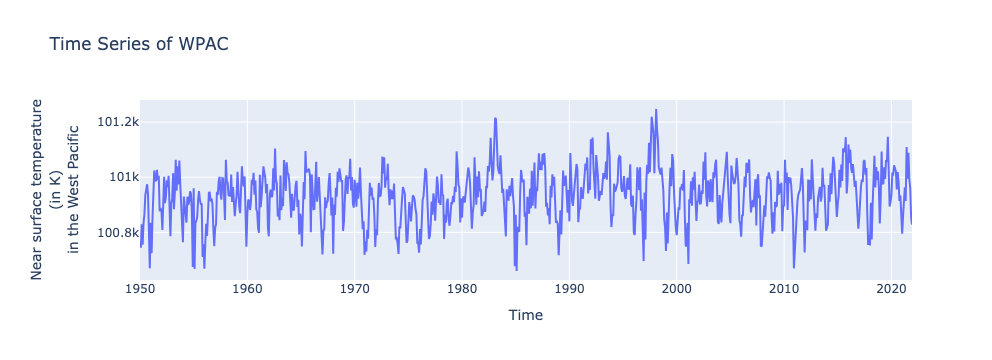

In [42]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=WPAC, mode='lines', name='WPAC'))
fig.update_layout(
    title='Time Series of WPAC',
    xaxis_title='Time',
    yaxis_title='Near surface temperature<br>(in K)<br>in the West Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)
fig.show()

## CPAC = Near surface temperature (in K) in the Central Pacific

In [43]:
CPAC = np.loadtxt('iera5_t2m_-150--130E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]

In [44]:
mean_CPAC = np.mean(CPAC)
std_dev_CPAC = np.std(CPAC)
median_CPAC = np.median(CPAC)
min_val_CPAC = np.min(CPAC)
max_val_CPAC = np.max(CPAC)

print("Mean:", mean_CPAC)
print("Standard Deviation:", std_dev_CPAC)
print("Median:", median_CPAC)
print("Minimum Value:", min_val_CPAC)
print("Maximum Value:", max_val_CPAC)

Mean: 298.8509971064815
Standard Deviation: 0.8447594851404049
Median: 298.91795
Minimum Value: 296.1973
Maximum Value: 300.8865


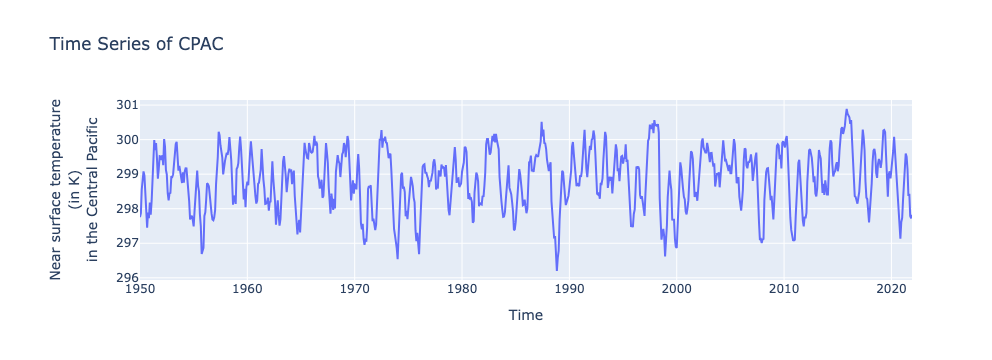

In [45]:
time_index = time_index[:len(CPAC)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=CPAC, mode='lines', name='CPAC'))
fig.update_layout(
    title='Time Series of CPAC',
    xaxis_title='Time',
    yaxis_title='Near surface temperature<br>(in K)<br>in the Central Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)
fig.show()

## EPAC = Near surface temperature (in K) in the East Pacific

In [46]:
EPAC = np.loadtxt('iera5_t2m_-100--80E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]

In [47]:
mean_EPAC = np.mean(EPAC)
std_dev_EPAC = np.std(EPAC)
median_EPAC = np.median(EPAC)
min_val_EPAC = np.min(EPAC)
max_val_EPAC = np.max(EPAC)

print("Mean:", mean_EPAC)
print("Standard Deviation:", std_dev_EPAC)
print("Median:", median_EPAC)
print("Minimum Value:", min_val_EPAC)
print("Maximum Value:", max_val_EPAC)

Mean: 296.9792201388889
Standard Deviation: 1.5031017287062765
Median: 296.94034999999997
Minimum Value: 293.807
Maximum Value: 300.8609


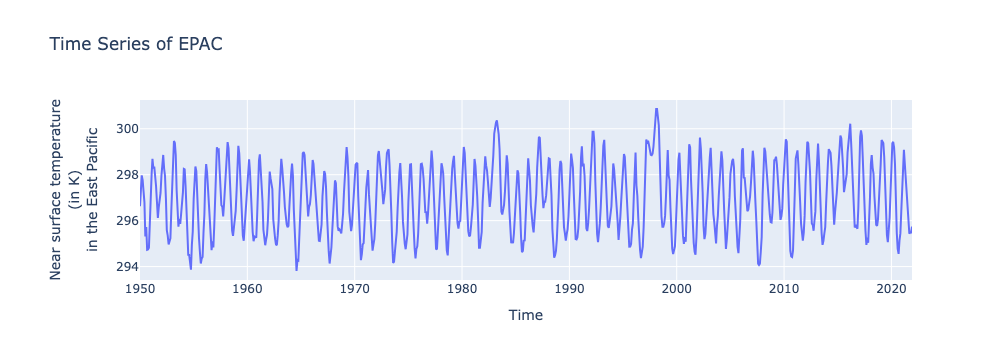

In [48]:
time_index = time_index[:len(EPAC)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=EPAC, mode='lines', name='EPAC'))
fig.update_layout(
    title='Time Series of EPAC',
    xaxis_title='Time',
    yaxis_title='Near surface temperature<br>(in K)<br>in the East Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)
fig.show()

## TW = Near surface winds (in m/s) in the Central Pacific

In [49]:
TW = np.loadtxt('iera5_u10m_-180--130E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]
TW *= -1 

In [50]:
mean_TW = np.mean(TW)
std_dev_TW = np.std(TW)
median_TW = np.median(TW)
min_val_TW = np.min(TW)
max_val_TW = np.max(TW)

print("Mean:", mean_TW)
print("Standard Deviation:", std_dev_TW)
print("Median:", median_TW)
print("Minimum Value:", min_val_TW)
print("Maximum Value:", max_val_TW)

Mean: 5.440672281446759
Standard Deviation: 1.0029878863066852
Median: 5.5784445
Minimum Value: -0.3439944
Maximum Value: 7.407164


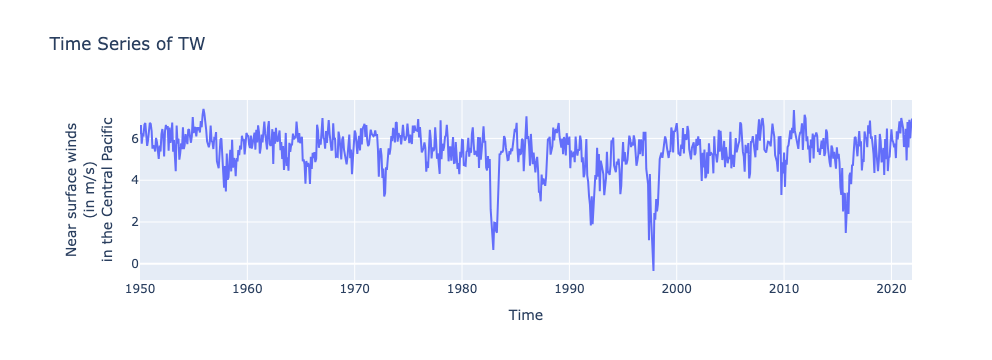

In [51]:
time_index = time_index[:len(TW)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=TW, mode='lines', name='TW'))

fig.update_layout(
    title='Time Series of TW',
    xaxis_title='Time',
    yaxis_title='Near surface winds<br>(in m/s)<br>in the Central Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)

fig.show()

## Extended Dataset and lists

In [52]:
extended_data = np.vstack((
    WPAC,
    CPAC,
    EPAC,
    TW
                )).T

In [53]:
means_climate = [mean_WPAC, mean_CPAC, mean_EPAC, mean_TW]
variances_climate = [(std_dev_WPAC**2), (std_dev_CPAC**2), (std_dev_EPAC**2), (std_dev_TW**2)]

In [54]:
df_climate = pd.DataFrame(extended_data, index=time_index, columns=['WPAC', 'CPAC', 'EPAC', 'TW'])

In [55]:
data_climate_list = [WPAC.T, CPAC.T, EPAC.T, TW.T]
data_climate_array = np.array(data_climate_list)
print(data_climate_array)

[[1.007654e+05 1.007447e+05 1.008298e+05 ... 1.009609e+05 1.008551e+05
  1.008284e+05]
 [2.977563e+02 2.978752e+02 2.985520e+02 ... 2.977851e+02 2.977210e+02
  2.978257e+02]
 [2.966236e+02 2.977186e+02 2.979710e+02 ... 2.954964e+02 2.954913e+02
  2.957404e+02]
 [6.193619e+00 6.642407e+00 5.747903e+00 ... 5.994689e+00 6.632870e+00
  6.947123e+00]]


# Results: Climate Data with 2 phi's

## First run of PCMCI

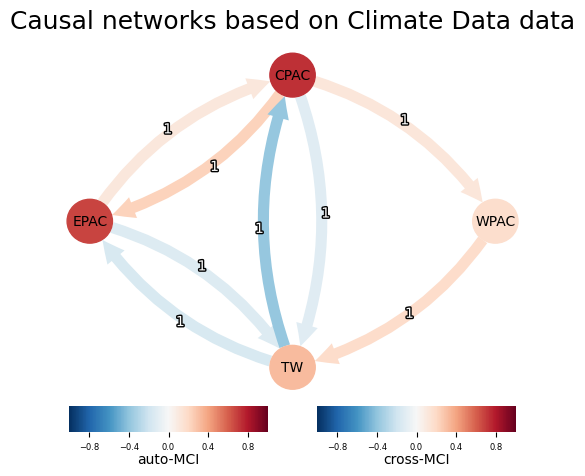

In [56]:
results_climate_run1 = Run_PCMCI(df_climate, parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Climate Data', plot=True)
# 

In [57]:
val_matrix_climate_run1 = results_climate_run1['val_matrix']
conf_matrix_climate_run1 = results_climate_run1['conf_matrix']

## Generate Dataset

In [58]:
phi_climate_run1, eigenvalues_phi1 = Non_random_initial_phi(val_matrix_climate_run1)

In [59]:
print(phi_climate_run1)

[[ 0.17373507  0.11975307  0.02447545  0.04915396]
 [ 0.07074018  0.73161387  0.11135553 -0.38836812]
 [-0.00390825  0.23154391  0.67338652 -0.16276586]
 [ 0.18385259 -0.12399532 -0.13851116  0.31312003]]


In [60]:
data_climate_run1, phi_climate_data1, _, _ = Generate_TVP_VAR(1, 964, 0.6, 864, phi_climate_run1, eigenvalues_phi1, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, seed=123)
#

TILLIE: begin generating dataset
TILLIE: we initialized phi
TILLIE: phi run with t=864 where d=864 and T=964. Last phi was: [[[ 0.17373507  0.11975307  0.02447545  0.04915396]
  [ 0.07074018  0.73161387  0.11135553 -0.38836812]
  [-0.00390825  0.23154391  0.67338652 -0.16276586]
  [ 0.18385259 -0.12399532 -0.13851116  0.31312003]]]. We try to generate with delta=-1.1,1.1 and seed=123
TILLIE: input is previous_phi[[[ 0.17373507  0.11975307  0.02447545  0.04915396]
  [ 0.07074018  0.73161387  0.11135553 -0.38836812]
  [-0.00390825  0.23154391  0.67338652 -0.16276586]
  [ 0.18385259 -0.12399532 -0.13851116  0.31312003]]], delta_min=-1.1, delta_max=1.1 and seed=123
Tillie: p=1, n=4
Tillie we finally found one!
TILLIE: generated the next phi
TILLIE: phi's generated, now onto the rest!


In [61]:
df_climate_run1_full, _ = GenerateDF(data_climate_run1, 1982)
df_climate_run1 = df_climate_run1_full.iloc[100:] #skipping first 100 rows so we are back at 864 length

In [62]:
print(df_climate_run1)

          WPAC      CPAC      EPAC        TW
1151 -0.647512 -1.947885 -2.843816  1.067874
1152  1.171216 -2.732221 -3.028263 -0.458411
1153 -0.229022 -1.098448 -4.352855  0.164167
1154 -0.233860 -0.518210 -2.828448  1.073883
1155 -0.343442 -0.645824 -1.184201 -0.959706
...        ...       ...       ...       ...
2010 -2.983309 -5.331734  4.113362  6.803596
2011 -5.748369 -0.522383  3.641250  1.383851
2012 -1.709384  3.117940  1.673527 -5.014478
2013  3.175805  6.316278  0.427131 -5.612053
2014  6.002739  7.642474 -0.660045 -2.034625

[864 rows x 4 columns]


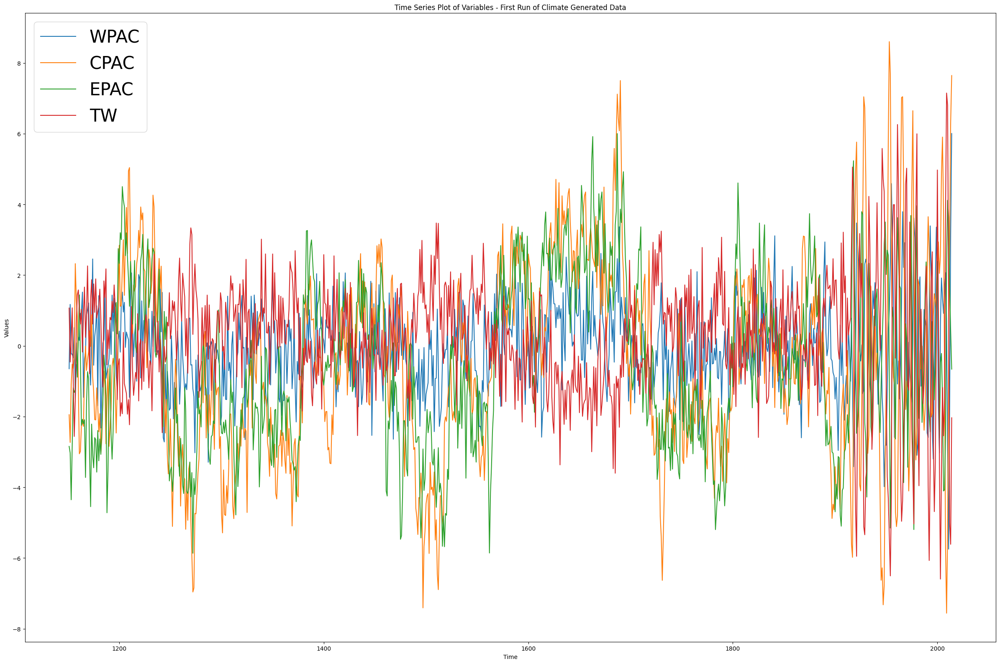

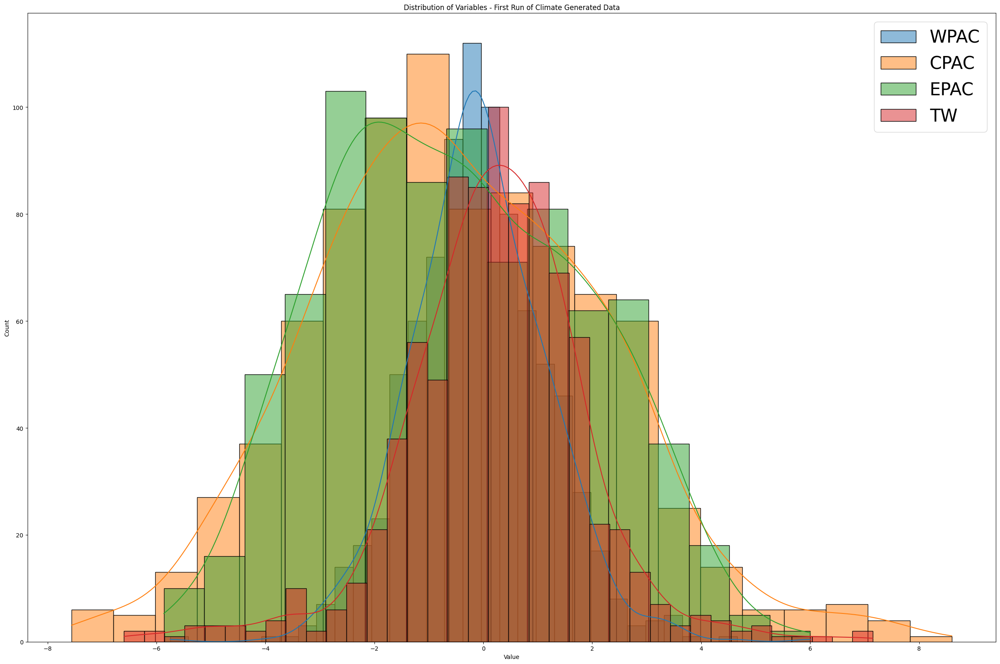

In [63]:
Plot_Simulated_Data_Seaborne(df_climate_run1, model_name = 'First Run of Climate Generated Data')

## Second run of PCMCI

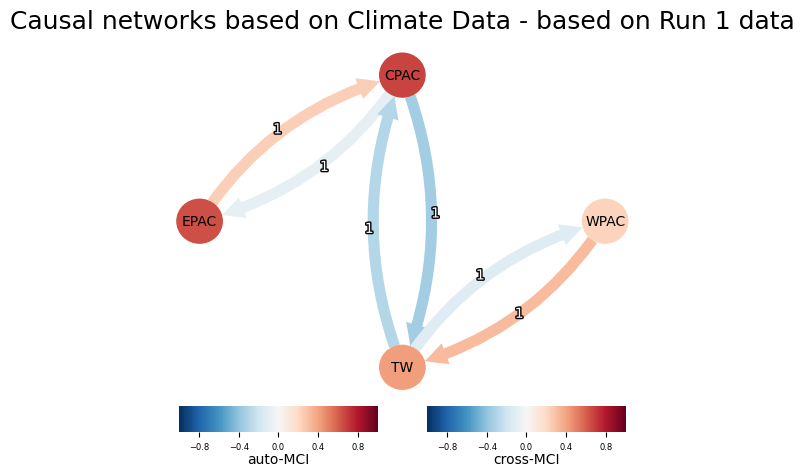

In [64]:
results_climate_run2 = Run_PCMCI(df_climate_run1, parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Climate Data - based on Run 1', plot=True)
# 

In [65]:
val_matrix_climate_run2 = results_climate_run2['val_matrix']
conf_matrix_climate_run2 = results_climate_run2['conf_matrix']

### Split runs

In [66]:
df_climate_run1_split = SplitDF(df_climate_run1, 2)

/var/folders/0k/k8d69k2119v0j8xpw_53txbm0000gn/T/ipykernel_5225/3691124510.py:5: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



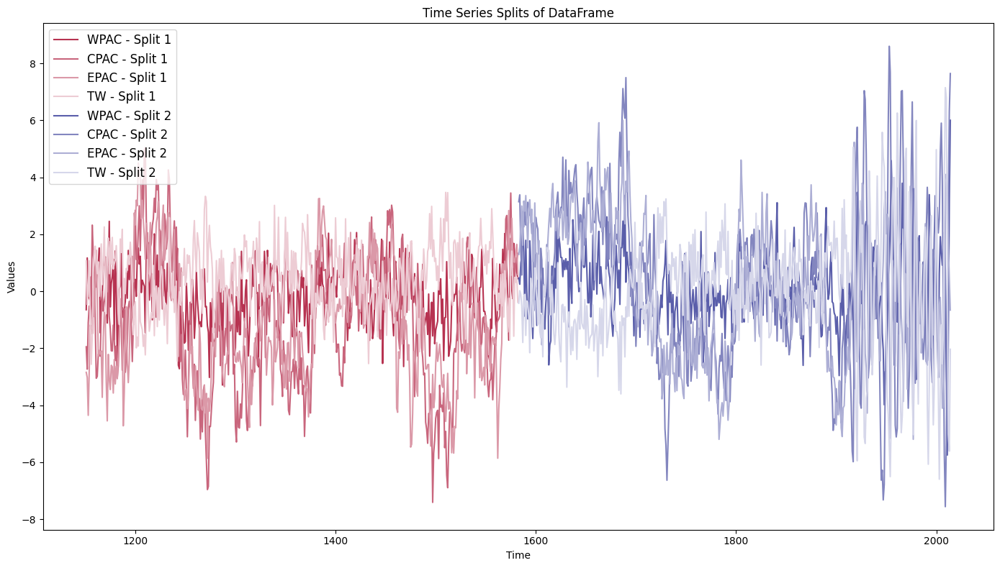

In [67]:
PlotSplitDFs_Seaborne(df_climate_run1_split, 'RdYlBu') #RdYlBu
# colormaps to choose from: https://matplotlib.org/stable/users/explain/colors/colormaps.html

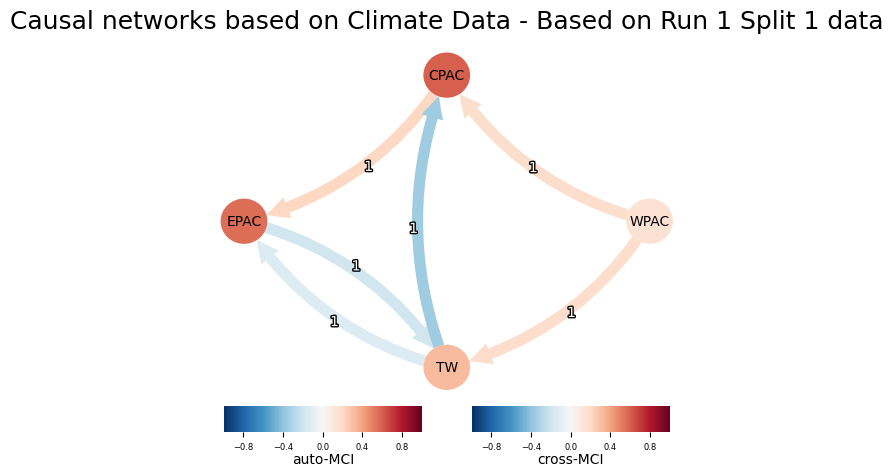

In [68]:
results_climate_run2_split1 = Run_PCMCI(df_climate_run1_split[0], parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Climate Data - Based on Run 1 Split 1', plot=True)
#

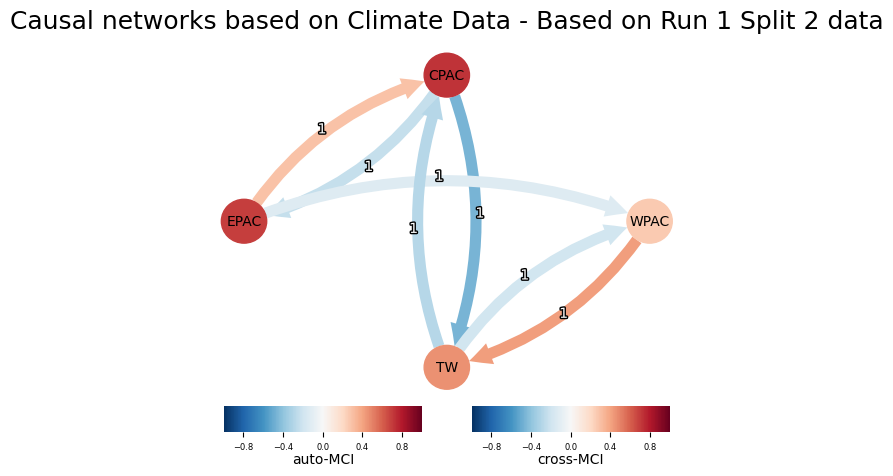

In [69]:
results_climate_run2_split2 = Run_PCMCI(df_climate_run1_split[1], parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Climate Data - Based on Run 1 Split 2', plot=True)
#

In [70]:
early_conf = results_climate_run2_split1['conf_matrix']
early_val = results_climate_run2_split1['val_matrix']
late_val = results_climate_run2_split2['val_matrix']

In [71]:
significant_increase5, significant_decrease5, increase5, decrease5, other5 = CheckLinkStrengthening(early_val, early_conf, late_val)


In [72]:
print(significant_increase5, significant_decrease5, increase5, decrease5, other5)



9 5 11 5 0


    for i in range(0,n): 
        for j in range(0,n): 
            before = early_val_matrix[j,i,1]
            after = late_val_matrix[j,i,1]
            if before > after:
                decrease += 1
                if after < early_conf_matrix[j,i,1,0]:
                    significant_decrease += 1
            elif before < after: 
                increase += 1
                if after > early_conf_matrix[j,i,1,1]:
                    significant_increase += 1
                    
                    j=WPAC_t-1
                    i=WPAC_t
                    1 = altijd zelfde
                    0 = lower | 1 = upper

In [77]:
print(early_conf)
early_conf[0,3,1,1]

[[[[ 0.          0.        ]
   [ 0.05891571  0.23707759]]

  [[ 0.          0.        ]
   [ 0.08250633  0.25921914]]

  [[ 0.          0.        ]
   [-0.14073587  0.04341298]]

  [[ 0.          0.        ]
   [ 0.09115096  0.26680643]]]


 [[[ 0.          0.        ]
   [-0.00977723  0.17317051]]

  [[ 0.          0.        ]
   [ 0.54329713  0.64018496]]

  [[ 0.          0.        ]
   [ 0.11578838  0.28951895]]

  [[ 0.          0.        ]
   [-0.13374828  0.05087391]]]


 [[[ 0.          0.        ]
   [ 0.01309506  0.19489071]]

  [[ 0.          0.        ]
   [-0.0800392   0.10501994]]

  [[ 0.          0.        ]
   [ 0.50474692  0.61024191]]

  [[ 0.          0.        ]
   [-0.27657219 -0.10195432]]]


 [[[ 0.          0.        ]
   [-0.06294975  0.12133199]]

  [[ 0.          0.        ]
   [-0.42438913 -0.27238148]]

  [[ 0.          0.        ]
   [-0.22823756 -0.04905605]]

  [[ 0.          0.        ]
   [ 0.23262676  0.39052085]]]]


NameError: name 'early_conf_matrix' is not defined

In [74]:
print(early_val)

[[[ 0.          0.14981638]
  [ 0.          0.17294501]
  [ 0.         -0.04928838]
  [ 0.          0.18114001]]

 [[ 0.          0.08273994]
  [ 0.          0.59496528]
  [ 0.          0.2050699 ]
  [ 0.         -0.04197347]]

 [[ 0.          0.10530964]
  [ 0.          0.01265254]
  [ 0.          0.5608916 ]
  [ 0.         -0.19153058]]

 [[ 0.          0.02956718]
  [ 0.         -0.3518516 ]
  [ 0.         -0.14036657]
  [ 0.          0.31482957]]]


In [75]:
early_phi = Non_random_initial_phi(early_val)
print(early_phi)

(array([[ 0.14981638,  0.08273994,  0.10530964,  0.02956718],
       [ 0.17294501,  0.59496528,  0.01265254, -0.3518516 ],
       [-0.04928838,  0.2050699 ,  0.5608916 , -0.14036657],
       [ 0.18114001, -0.04197347, -0.19153058,  0.31482957]]), array([2.77555756e-17, 3.67433144e-01, 0.00000000e+00, 0.00000000e+00]))


In [76]:
late_phi, _ = Non_random_initial_phi(late_val)
print(late_phi)

[[ 0.25944038  0.08481675 -0.12764233 -0.18971849]
 [-0.02982519  0.71926493  0.29567228 -0.28366473]
 [ 0.11617125 -0.24122129  0.69021027  0.07719712]
 [ 0.42156547 -0.46718812  0.05061329  0.45889507]]


# Results: Split Climate Data

## Splitting the climate dataset

In [211]:
df_split_climate = SplitDF(df_climate, 2)

/var/folders/0k/k8d69k2119v0j8xpw_53txbm0000gn/T/ipykernel_42018/2664098769.py:5: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



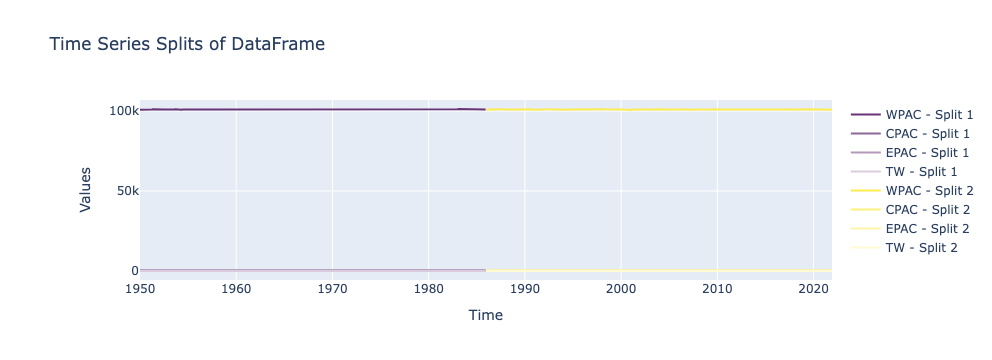

In [212]:
PlotSplitDFs(df_split_climate)

## First run of PCMCI

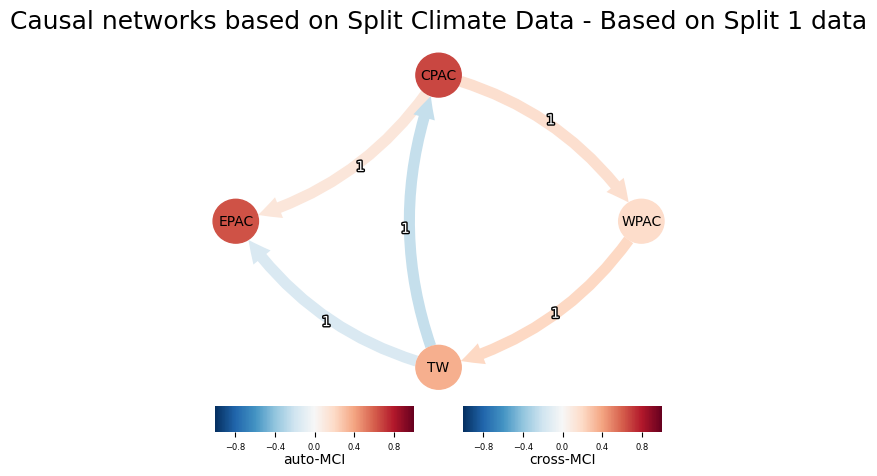

In [213]:
results_split1_climate_run1 = Run_PCMCI(df_split_climate[0], parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Split Climate Data - Based on Split 1', plot=True)
#

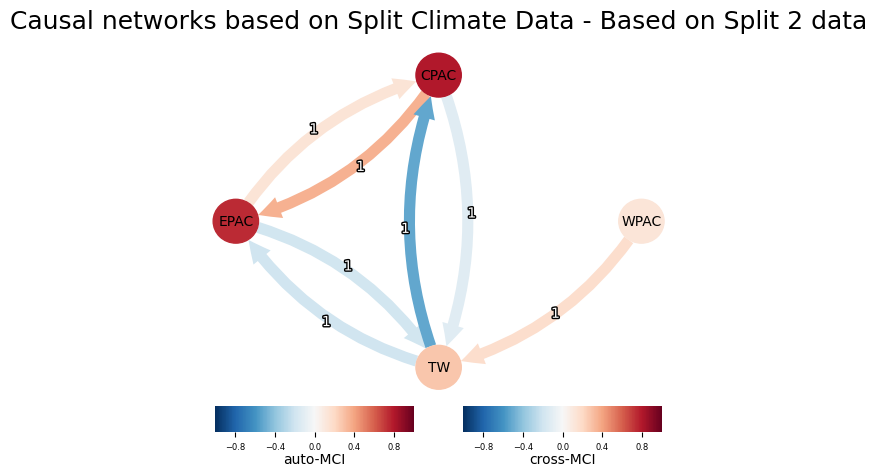

In [214]:
results_split2_climate_run1 = Run_PCMCI(df_split_climate[1], parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Split Climate Data - Based on Split 2', plot=True)
#

In [254]:
sig_incr5, sig_decr5, incr5, decr5, oth5 = CheckLinkStrengthening(results_split1_climate_run1['val_matrix'], results_split1_climate_run1['conf_matrix'], results_split2_climate_run1['val_matrix'])
print('Significant increases:', sig_incr5)
print('Significant decreases:', sig_decr5)
print('Increases:', incr5)
print('Decreases:', decr5)
print('Nothing much:', oth5)

Significant increases: 3
Significant decreases: 2
Increases: 6
Decreases: 10
Nothing much: 0


## Generate Datasets

In [225]:
phi1_climate_run1, eigenvalues1_phi1 = Non_random_initial_phi(results_split1_climate_run1['val_matrix'])

In [243]:
phi2_climate_run1, eigenvalues2_phi1 = Non_random_initial_phi(results_split2_climate_run1['val_matrix'])
print(phi2_climate_run1)
print(eigenvalues2_phi1)

[[ 0.12833864  0.07952593  0.08392546  0.07810886]
 [ 0.06860087  0.79992865  0.13372795 -0.5215497 ]
 [-0.01017586  0.35172836  0.74855149 -0.1956824 ]
 [ 0.17334596 -0.12345338 -0.19013367  0.27718146]]
[0.        0.3698989 0.        0.       ]


In [244]:
data1_climate_run1, phi1_climate_data1, _, _ = Generate_TVP_VAR(1, 432, 0.6, 432, phi1_climate_run1, eigenvalues1_phi1, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, seed=123)
#

In [245]:
data2_climate_run1, phi2_climate_data1, _, _ = Generate_TVP_VAR(1, 432, 0.6, 432, phi2_climate_run1, eigenvalues2_phi1, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, seed=222)
#

[[[[ 0.12833864  0.07952593  0.08392546  0.07810886]
   [ 0.06860087  0.79992865  0.13372795 -0.5215497 ]
   [-0.01017586  0.35172836  0.74855149 -0.1956824 ]
   [ 0.17334596 -0.12345338 -0.19013367  0.27718146]]]


 [[[ 0.12833864  0.07952593  0.08392546  0.07810886]
   [ 0.06860087  0.79992865  0.13372795 -0.5215497 ]
   [-0.01017586  0.35172836  0.74855149 -0.1956824 ]
   [ 0.17334596 -0.12345338 -0.19013367  0.27718146]]]


 [[[ 0.12833864  0.07952593  0.08392546  0.07810886]
   [ 0.06860087  0.79992865  0.13372795 -0.5215497 ]
   [-0.01017586  0.35172836  0.74855149 -0.1956824 ]
   [ 0.17334596 -0.12345338 -0.19013367  0.27718146]]]


 ...


 [[[ 0.12833864  0.07952593  0.08392546  0.07810886]
   [ 0.06860087  0.79992865  0.13372795 -0.5215497 ]
   [-0.01017586  0.35172836  0.74855149 -0.1956824 ]
   [ 0.17334596 -0.12345338 -0.19013367  0.27718146]]]


 [[[ 0.12833864  0.07952593  0.08392546  0.07810886]
   [ 0.06860087  0.79992865  0.13372795 -0.5215497 ]
   [-0.01017586  0.3517

In [236]:
df1_climate_run1, _ = GenerateDF(data1_climate_run1, 1982)

In [237]:
df2_climate_run1, _ = GenerateDF(data2_climate_run1, 1998)

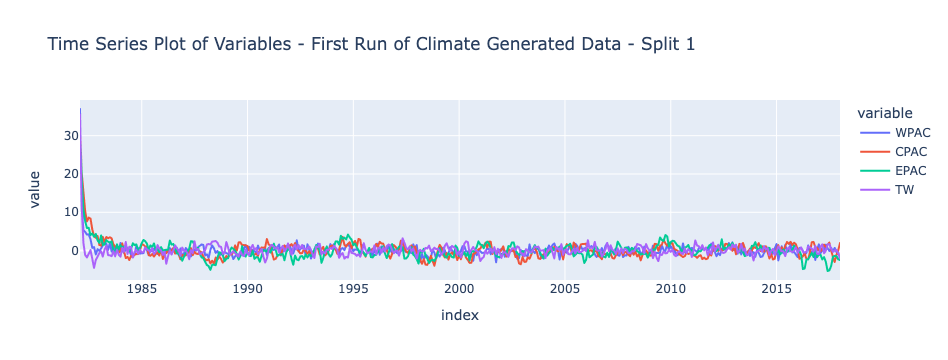

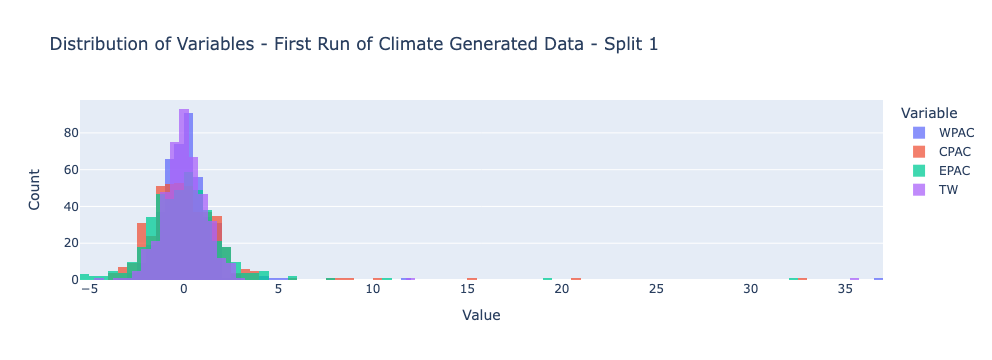

In [238]:
Plot_Simulated_Data(df1_climate_run1, model_name = 'First Run of Climate Generated Data - Split 1')

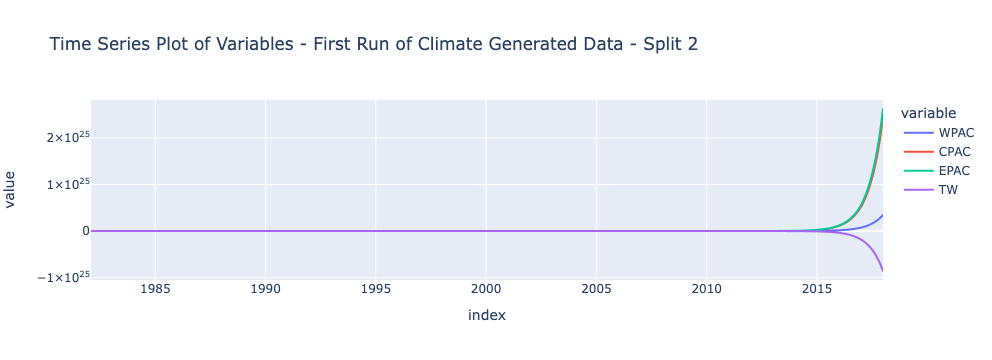

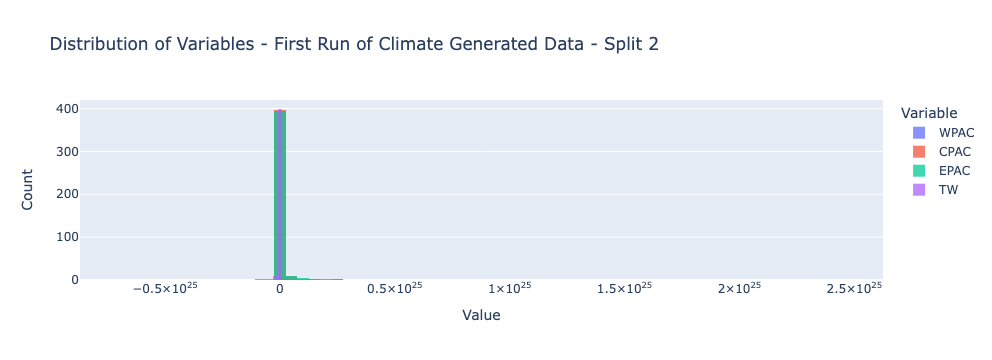

In [239]:
Plot_Simulated_Data(df2_climate_run1, model_name = 'First Run of Climate Generated Data - Split 2')

## Second run of PCMCI

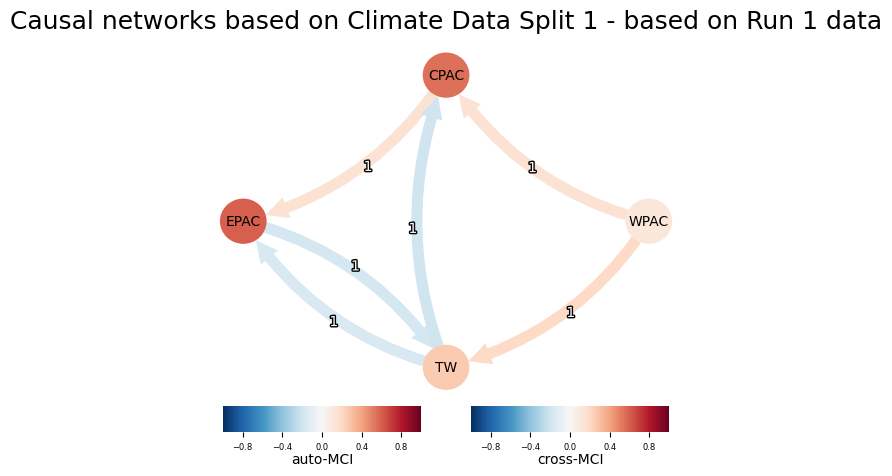

In [240]:
results1_climate_run2 = Run_PCMCI(df1_climate_run1, parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Climate Data Split 1 - based on Run 1', plot=True)
# 

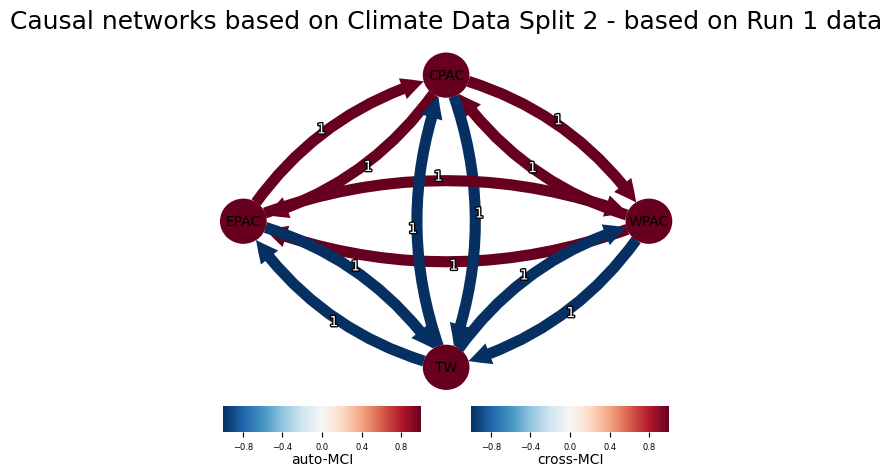

In [241]:
results2_climate_run2 = Run_PCMCI(df2_climate_run1, parcorr_conf, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'Climate Data Split 2 - based on Run 1', plot=True)
# 

# Results: Stable VAR Data

Now we will generate a stable VAR set. We will later on split this into two parts and check in how many cases (if we run it M times for example) we end up with more links in the second part.

We base the beta and gamma on the phi we get after running pcmci once for the climate data (phi_climate_run1). This results in beta=0.38836812, gamma=0.82626493. Remember that beta correponds to the off-diagonal elements, and gamma to the diagonal.

## Only 2 cuts

In [508]:
dictionary_results = CheckLinkStrengthening_RandomPhi_MC(20000, 0.6, parcorr_conf, delta=1, p=1, n=4, beta=0.38836812, gamma=0.82626493, T=864, d=864, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1000)

Running simulations: 100%|██████████| 20000/20000 [2:52:18<00:00,  1.93it/s]      


In [509]:
mean_significant_increase_stableVAR, mean_significant_decrease_stableVAR, mean_increase_stableVAR, mean_decrease_stableVAR, mean_other_stableVAR = MeanLinkStrengthening(dictionary_results, print_means=True)

Mean Significant Increase: 2.19035
Mean Significant Decrease: 2.31635
Mean Increase: 7.94015
Mean Decrease: 8.05985
Mean Other: 0.0


In [510]:
strengthening, strengthening_seeds = CountLinkStrengthening(dictionary_results, delta=1, print_count=True)

% of simulations where there were more significantly increasing links than significantly decreasing: 22.189999999999998


In [511]:
frob_norm_strengthening = CompareMatrices(phi_climate_run1, strengthening_seeds, 4, 1, 0.6, beta=0.01, gamma=0.01)

Comparing Matrices: 100%|██████████| 4438/4438 [00:11<00:00, 384.79it/s]


In [512]:
other_seeds = OppositeList(strengthening_seeds)

In [513]:
frob_norm_other = CompareMatrices(phi_climate_run1, other_seeds, n=4, p=1, s=0.6, beta=0.01, gamma=0.01)

Comparing Matrices: 100%|██████████| 15545/15545 [00:42<00:00, 366.32it/s]


In [515]:
print('Frobenius distance for strengthening seeds:', frob_norm_strengthening)
print('Frobenius distance for other seeds:', frob_norm_other)
if frob_norm_strengthening > frob_norm_other:
    print("Frobenius norm for strengthening is larger, so the climate phi is more similar to the strengthening seeds!")
elif frob_norm_strengthening < frob_norm_other:
    print("Frobenius norm for other is larger, so the climate phi is more similar to the other seeds.")
else:
    print("Frobenius norms for both are equal.")

Frobenius distance for strengthening seeds: 1.2836118751266385
Frobenius distance for other seeds: 1.2835884748447233
Frobenius norm for strengthening is larger, so the climate phi is more similar to the strengthening seeds!


### Minus the Diagonal!!!

In [ ]:
dictionary_results_minusdiagonal = CheckLinkStrengthening_RandomPhi_MC_Diagonal(10000, 0.75, parcorr_conf, delta=1, p=1, n=4, beta=0.38836812, gamma=0.82626493, T=864, d=864, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1000)

In [ ]:
mean_significant_increase_stableVAR_md, mean_significant_decrease_stableVAR_md, mean_increase_stableVAR_md, mean_decrease_stableVAR_md, mean_other_stableVAR_md = MeanLinkStrengthening(dictionary_results_minusdiagonal, print_means=True)


In [ ]:
strengtening_percentage_md, strengtening_percentage_minus_diagonal, strengthening_seeds_md, comparison_minus_diagonal = CountLinkStrengthening_MinusDiagonal(dictionary_results_minusdiagonal, delta=1, print_count=True)


## More than 2 cuts

First we test 4 cuts

In [69]:
dictionary_results_4cuts = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 3, 1, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=864, cuts=4, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)
#cuts=4, min_tp = 3, max_tp = 1

Running simulations: 100%|██████████| 1000/1000 [07:56<00:00,  2.10it/s]


In [80]:
seeds_sig_increasement_4cuts, seeds_sig_decreasement_4cuts, seeds_other_4cuts = CountLinkStrengthening_MoreCuts(dictionary_results_4cuts, 4, 3, 1, print_count=True)

Results for 1000 simulations of datasets with 4 cuts and where we set min_tp=3, max_tp1:
Significantly increasing datasets: 0.3%
Significantly decreasing datasets: 0.1%
Other datasets: 99.6%


In [84]:
dictionary_results_4cuts2 = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 2, 0, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=864, cuts=4, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)
#cuts=4, min_tp = 2, max_tp = 0

Running simulations: 100%|██████████| 1000/1000 [04:33<00:00,  3.65it/s]


In [85]:
seeds_sig_increasement_4cuts2, seeds_sig_decreasement_4cuts2, seeds_other_4cuts2 = CountLinkStrengthening_MoreCuts(dictionary_results_4cuts2, 4, 2, 0, print_count=True)

Results for 1000 simulations of datasets with 4 cuts and where we set min_tp=2, max_tp0:
Significantly increasing datasets: 3.9%
Significantly decreasing datasets: 4.7%
Other datasets: 91.4%


Now 8 cuts

In [71]:
dictionary_results_8cuts = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 5, 2, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=864, cuts=8, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)
#cuts=8, min_tp = 5, max_tp = 2

Running simulations: 100%|██████████| 1000/1000 [29:48<00:00,  1.79s/it]   


In [79]:
seeds_sig_increasement_8cuts, seeds_sig_decreasement_8cuts, seeds_other_8cuts = CountLinkStrengthening_MoreCuts(dictionary_results_8cuts, 8, 5, 2, print_count=True)

Results for 1000 simulations of datasets with 8 cuts and where we set min_tp=5, max_tp2:
Significantly increasing datasets: 0.0%
Significantly decreasing datasets: 0.1%
Other datasets: 99.9%


Now 12 cuts

In [73]:
dictionary_results_12cuts = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 8, 3, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=864, cuts=8, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=100)
#cuts=12, min_tp = 8, max_tp = 3

Running simulations: 100%|██████████| 1000/1000 [11:20<00:00,  1.47it/s]


In [81]:
seeds_sig_increasement_12cuts, seeds_sig_decreasement_12cuts, seeds_other_12cuts = CountLinkStrengthening_MoreCuts(dictionary_results_12cuts, 12, 8, 3, print_count=True)

Results for 1000 simulations of datasets with 12 cuts and where we set min_tp=8, max_tp3:
Significantly increasing datasets: 0.0%
Significantly decreasing datasets: 0.0%
Other datasets: 100.0%


Now 16 cuts

In [75]:
dictionary_results_16cuts = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 10, 4, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=864, cuts=8, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=100)
#cuts=16, min_tp = 10, max_tp = 4

Running simulations: 100%|██████████| 1000/1000 [10:01<00:00,  1.66it/s]


In [82]:
seeds_sig_increasement_16cuts, seeds_sig_decreasement_16cuts, seeds_other_16cuts = CountLinkStrengthening_MoreCuts(dictionary_results_16cuts, 16, 10, 4, print_count=True)

Results for 1000 simulations of datasets with 16 cuts and where we set min_tp=10, max_tp4:
Significantly increasing datasets: 0.0%
Significantly decreasing datasets: 0.0%
Other datasets: 100.0%


In [ ]:
seeds_sig_incr = [seeds_sig_increasement_4cuts, seeds_sig_increasement_4cuts2, seeds_sig_increasement_8cuts, seeds_sig_increasement_12cuts, seeds_sig_increasement_16cuts]
seeds_sig_decr = [seeds_sig_decreasement_4cuts, seeds_sig_decreasement_4cuts2, seeds_sig_decreasement_8cuts, seeds_sig_decreasement_12cuts, seeds_sig_decreasement_16cuts]
seeds_other = [seeds_other_4cuts, seeds_other_4cuts2, seeds_other_8cuts, seeds_other_12cuts, seeds_other_16cuts]

## More than 2 cuts - Bigger dataset

We check the cuts as well for a 4 times as big dataset, so that every cut is just as large as our initial dataset.

In [87]:
dictionary_results_4cuts_big = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 3, 1, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=3456, d=3456, cuts=4, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)
#cuts=4, min_tp = 3, max_tp = 1

Running simulations: 100%|██████████| 1000/1000 [10:44<00:00,  1.55it/s]


In [88]:
seeds_sig_increasement_4cuts, seeds_sig_decreasement_4cuts, seeds_other_4cuts = CountLinkStrengthening_MoreCuts(dictionary_results_4cuts, 4, 3, 1, print_count=True)

Results for 1000 simulations of datasets with 4 cuts and where we set min_tp=3, max_tp1:
Significantly increasing datasets: 0.3%
Significantly decreasing datasets: 0.1%
Other datasets: 99.6%


In [89]:
dictionary_results_4cuts2_big = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 2, 0, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=3456, d=3456, cuts=4, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 4 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)
#cuts=4, min_tp = 2, max_tp = 0

Running simulations: 100%|██████████| 1000/1000 [05:58<00:00,  2.79it/s]


In [90]:
seeds_sig_increasement_4cuts2_big, seeds_sig_decreasement_4cuts2_big, seeds_other_4cuts2_big = CountLinkStrengthening_MoreCuts(dictionary_results_4cuts2_big, 4, 2, 0, print_count=True)

Results for 1000 simulations of datasets with 4 cuts and where we set min_tp=2, max_tp0:
Significantly increasing datasets: 4.0%
Significantly decreasing datasets: 5.5%
Other datasets: 90.5%


In [91]:
dictionary_results_8cuts_big = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(1000, 0.6, parcorr_conf, 5, 2, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=3456, d=3456, cuts=8, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Stable VAR - 8 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)
#cuts=8, min_tp = 5, max_tp = 2

Running simulations: 100%|██████████| 1000/1000 [20:47<00:00,  1.25s/it]


In [92]:
seeds_sig_increasement_8cuts_big, seeds_sig_decreasement_8cuts_big, seeds_other_8cuts_big = CountLinkStrengthening_MoreCuts(dictionary_results_8cuts_big, 8, 5, 2, print_count=True)

Results for 1000 simulations of datasets with 8 cuts and where we set min_tp=5, max_tp2:
Significantly increasing datasets: 0.0%
Significantly decreasing datasets: 0.0%
Other datasets: 100.0%


# Results: Unstable VAR Data

In [221]:
dictionary_results_4cuts_unstable = CheckLinkStrengthening_RandomPhi_MC_MoreCuts(5, 0.6, parcorr_conf, 1, 0, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=432, cuts=2, standard=True, constant=False, delta_min=0, delta_max=0.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='Unstable VAR - 2 Cuts', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=5)
#cuts=4, min_tp = 3, max_tp = 1
#def CheckLinkStrengthening_RandomPhi_MC_MoreCuts(M, s, test, min_tp, max_tp, delta=1, p=1, n=4, beta=0.01, gamma=0.01, T=864, d=432, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  #start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  #alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=None):

Running simulations:   0%|          | 0/5 [00:00<?, ?it/s]

TILLIE: random_initial_phi
TILLIE: begin generating dataset
TILLIE: we initialized phi
TILLIE: phi run with t=432 where d=432 and T=864. Last phi was: [[[ 1.00360907e+00  6.07672719e-03 -4.67821789e-03  5.45361596e-04]
  [-4.19922398e-03  9.91507031e-01 -1.42157446e-03 -9.15717991e-03]
  [ 3.94269559e-03 -1.23960958e-03  9.91970078e-01 -2.16873373e-03]
  [ 9.80442216e-03  7.51045985e-03  1.46760426e-04  9.97161475e-01]]]. We try to generate with delta=0,0.1 and seed=5
TILLIE: input is previous_phi[[[ 1.00360907e+00  6.07672719e-03 -4.67821789e-03  5.45361596e-04]
  [-4.19922398e-03  9.91507031e-01 -1.42157446e-03 -9.15717991e-03]
  [ 3.94269559e-03 -1.23960958e-03  9.91970078e-01 -2.16873373e-03]
  [ 9.80442216e-03  7.51045985e-03  1.46760426e-04  9.97161475e-01]]], delta_min=0, delta_max=0.1 and seed=5
Tillie: p=1, n=4


Running simulations:   0%|          | 0/5 [15:58<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
seeds_sig_increasement_4cuts_unstable, seeds_sig_decreasement_4cuts_unstable, seeds_other_4cuts_unstable = CountLinkStrengthening_MoreCuts(dictionary_results_4cuts_unstable, 4, 3, 1, print_count=True)
# 

In [95]:
dictionary_results = CheckLinkStrengthening_RandomPhi_MC(1000, 0.6, parcorr_conf, delta=1, p=1, n=4, beta=0.38836812, gamma=0.82626493, T=864, d=864, cuts=2, standard=True, constant=False, delta_min=-1.1, delta_max=1.1, 
                                                  start_year=1982, plot_data_graph=False, plot_splits_graph=False, model='', tau_max=1, tau_min=1, pc_alpha=0.1, 
                                                  alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], plot_dag=False, seed=1)

strengthening, strengthening_seeds = CountLinkStrengthening(dictionary_results, delta=1, print_count=True)

Running simulations: 100%|██████████| 1000/1000 [04:21<00:00,  3.83it/s]

% of simulations where there were more significantly increasing links than significantly decreasing: 23.9


In [96]:
print(seeds_sig_increasement_4cuts)
print(strengthening_seeds)

[119, 230, 517]
[3, 4, 8, 15, 16, 19, 36, 37, 50, 51, 56, 65, 67, 71, 74, 75, 76, 77, 80, 84, 89, 97, 103, 104, 108, 113, 115, 116, 119, 121, 126, 135, 139, 140, 149, 158, 162, 175, 178, 185, 186, 188, 191, 193, 196, 198, 205, 210, 213, 215, 218, 223, 231, 244, 245, 254, 256, 260, 264, 268, 274, 276, 277, 281, 282, 283, 285, 286, 289, 291, 294, 298, 299, 302, 307, 309, 321, 322, 323, 324, 326, 327, 330, 331, 333, 336, 337, 348, 353, 354, 355, 356, 359, 361, 363, 365, 366, 368, 374, 379, 380, 381, 383, 386, 387, 396, 408, 410, 411, 425, 431, 433, 437, 440, 446, 448, 453, 462, 463, 465, 474, 485, 486, 492, 493, 498, 503, 509, 510, 511, 513, 516, 519, 524, 540, 544, 553, 559, 564, 573, 577, 587, 588, 590, 593, 599, 601, 609, 618, 625, 626, 632, 642, 646, 649, 652, 655, 657, 663, 668, 669, 670, 671, 675, 688, 690, 694, 697, 699, 700, 707, 708, 721, 726, 732, 741, 742, 746, 749, 753, 754, 755, 759, 761, 766, 772, 778, 784, 785, 786, 791, 794, 801, 816, 821, 824, 827, 828, 830, 831, 837, 845

### Bar Chart

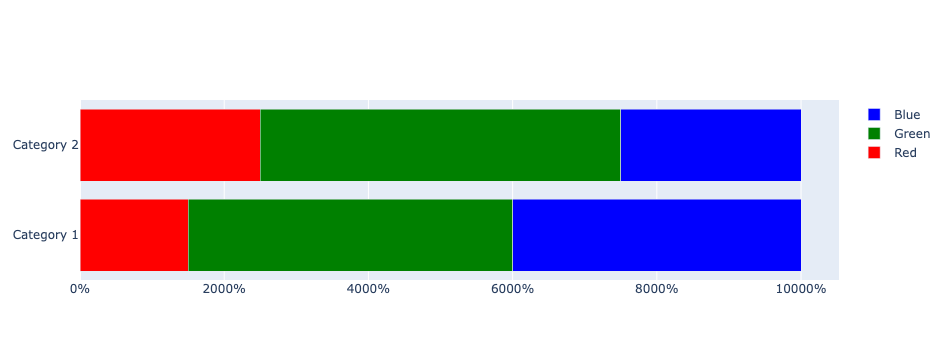

In [83]:
# Data for the chart
categories = ['Category 1', 'Category 2']
red_values = [15, 25]
green_values = [45, 50]
blue_values = [40, 25]

# Create the figure
fig = go.Figure()

# Add red segments
fig.add_trace(go.Bar(
    y=categories,
    x=red_values,
    name='Red',
    orientation='h',
    marker=dict(color='red')
))

# Add green segments
fig.add_trace(go.Bar(
    y=categories,
    x=green_values,
    name='Green',
    orientation='h',
    marker=dict(color='green')
))

# Add blue segments
fig.add_trace(go.Bar(
    y=categories,
    x=blue_values,
    name='Blue',
    orientation='h',
    marker=dict(color='blue')
))

# Update layout for 100% stacked bar chart
fig.update_layout(barmode='stack',
                  xaxis=dict(tickformat='.0%'))

fig.show()


# CVAR Formula

In [68]:

def CVAR(data, p, ordering=None, JT=None):
  """
  Fits a Causal VAR(p) model and reports the related matrices in package as a 
  dict. Valid keys for the resulting dictionary include:
    'block covariance', 'partial correlations', 'K', 'K-original' (only exists
    when restricted == True), 'A', 'B', and 'Delta'
  For details, please refer to the paper.

  Parameters
  ----------
  data: array_like
    A multi-dimensional time series.
  p: int
    A positive integer indicating the order of the desired VAR model.
  ordering: list
    An ordered list specifying the desired variable ordering for the data
  JT: dict, default None
    A pseudo-graph object that describes the junction tree structure based on
    a decomposable graph genereated with contemporaneous variables in the data.  
    
    Setting JT to a non-None value will enable covariance selection and lead to
    a restricted VAR model (zeros will be set to the corresponding positions in
    the based on the given junction tree).

    Example: 
    >> JT_Fin_VAR1={'cliques': 
                    [['BVSP', 'EM', 'NIK'], 
                      ['BVSP', 'DAX', 'EM', 'FTSE', 'ISE', 'SP'], 
                      ['BVSP', 'DAX', 'EU', 'FTSE', 'ISE']],
                  'separators': 
                    [['BVSP', 'EM'], 
                      ['BVSP', 'DAX', 'FTSE', 'ISE']]}

  Returns
  -------
  outputs: dict
    A collection of important matrices for the causal VAR model stored as
    {'matrix_name' : matrix} pairs.
  
  """
  if ordering is not None:
    data = data.reindex(columns=ordering)
  else:
    ordering = data.columns

  X = np.array(data)
  n, d = X.shape
  # For VAR(p), we need the block Toeplitz covariance matrix C_{p+1}
  CC = block_covariance(data, p+1, keep_label=True)
  K = pd.DataFrame(np.linalg.inv(CC), columns=CC.columns, index=CC.columns)
  cond_C_inv = K.iloc[0:d, 0:d]

  outputs = {
      'block covariance': CC,
      'partial correlations': partial_cor(cond_C_inv, keep_label=True),
    }

  if JT is not None:
    # conduct covariance selection and build a restricted CVAR model
    outputs['K-original']= K # store the original concentration matrix K
    K = cov_selection(data, p, JT, keep_label=True) 

  L, D = block_LDL(K, p, d)
  outputs['K'] = K
  outputs['A'] = pd.DataFrame(L[:d,:d].T, columns=ordering, index=ordering)
  outputs['B'] = pd.DataFrame(L[d:,:d].T, columns=CC.columns[d:], index=ordering)
  outputs['Delta'] = np.linalg.inv(D[:d,:d])  
  
  return outputs 



# Section 1: functions for analyzing multi-variate time series data;
## primarily used to construct graphs for our casual VAR model along with the
## NetworkX package.
def covariance_func(data, h, keep_label=False):
  """
  Computes the ergodic estimate for C(h) (the covariance function for the 
  VAR model)
  
  Parameters
  ----------
  data: array_like
    A multi-dimensional time series.
  h: an integer
   An integer, can be negative.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  

  Returns
  -------
  C: np.array (default) or pd.DataFrame
    A d x d matrix (with the same variable labelling as data) that serves as the
    the ergodic estimate for C(h).
  """
  if keep_label and (type(data) is not pd.DataFrame):
    raise TypeError("data (first argument) has to be a pd.DataFrame"
    " in order to carry variable labels.")

  X = np.array(data) 
  n, d = X.shape 
  h_abs = abs(h) # in case when h is negative

  # compute Xbar, a row vector containing the sample means for each variable.
  Xbar = np.zeros((1,d)) 
  for i in range(d):
    Xbar[0, i] = np.mean(X[: , i])

  # construct C based
  C = np.zeros((d, d))
  for i in range(n - h_abs):
    Z0 = np.transpose(X[i, :] - Xbar) # column vector (temp)
    Z1 = X[i + h_abs, :] - Xbar # row vector (temp)
    C = C + np.matmul(Z0, Z1) # running sum of outer products

  C = np.true_divide(C, n) # divde every entry in C by the sample size n.

  # return C^T(h) if h is negative (see page 4, ver.0727_2021, above Eq(4))
  if h < 0:
    return C.T
  # otherwise, return C(h) (h is positive).
  return C


def block_covariance(data, k, keep_label=False):
  """
  Computes the block Toeplitz covairnce matrix C_k (intended for VAR(k-1)) using 
  the values of the covariance function C(h). 

  Parameters
  ----------
  data: array_like
    A multi-dimensional time series
  k: an integer
    A positive integer.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  

  Returns
  -------
  CC, np.array (default) or pd.DataFrame
    CC is a symmetric, positive definite block Toeplitz matrix with 
    p x p blocks which are d x d covariance matrices C(h)'s.

  Remarks
  -------
    CC is the concentration matrix K that should be used for the VAR(k-1) model. 
    
    To avoid off-by-one error use the concentration_mat() function below.
  """
  if keep_label and (type(data) is not pd.DataFrame):
    raise TypeError("data (first argument) has to be a pd.DataFrame"
    " in order to carry variable labels.")

  X = np.array(data)
  n, d = data.shape

  # construct the block Toeplitz covariance matrix row-by-row, block-by-block
  CC = []
  for i in range(k):
    row_block_vec = []
    for j in range(k):
      h = i - j
      row_block_vec.append( covariance_func(data, h) )
    CC.append(row_block_vec) # add the next row of blocks to CC
  
  CC = np.block(CC) # "unwrap" the blocks
  
  if keep_label:
    # extend the labels to fit the matrices for VAR(k-1)
    labels = extend_labels(data, k-1)
    return pd.DataFrame(CC, index = labels, columns = labels)
    
  return pd.DataFrame(CC)

      
  
def concentration_mat(data, p, keep_label=False):
  """
  Computes the concentration matrix K, inverse of the block Toeplitz co-
  variance matrix, for the VAR(p) model.
  
  Parameters
  ----------
  data: array_like
    A multi-dimensional time series
  p: an integer
    A positive integer indicating the order of the desired VAR model.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  

  Returns
  -------
  K: np.array (default) or pd.DataFrame
    K is the inverse of the symmetric, positive definite block Toeplitz 
    matrix with p x p blocks which are d x d covariance matrices C(h)'s.
    
    The upper left d x d block of K is the inverse of the conditional
    covariance matrix C(p|1,..., p-1).
  """
  CC = block_covariance(data, p+1, keep_label)

  if keep_label:
    return pd.DataFrame(np.linalg.inv(CC), index=CC.columns, columns=CC.columns)
  
  return np.linalg.inv(CC)


def inv_cond_cov(data, p, keep_label=False):
  """
  Computes the conditional covariance matrix C(p|1,...,p-1) using the K matrix 
  (i.e., inverse of the block covariance matrix) (maybe inefficient)
  
  Parameters
  ----------
  data: array_like
    A multi-dimensional time series
  p: an integer
    A positive integer indicating the order of the desired VAR model.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  

  Returns
  -------
  matrix: np.array (default) or pd.DataFrame
    The inverse of the conditional covariance matrix C(p|1,..., p-1) for the 
    time series data.
  """
  n,d = data.shape
  K = concentration_mat(data, p, keep_label)
  if keep_label:
    return K.iloc[:d, :d]
  return K[:d, :d]


def partial_cor(C_inv, keep_label=False):
  """
  Computes the partial correlation matrix based on the concentration matrix K.

  Parameters
  ----------
  C_inv: array_like
    A conentration matrix (inverse of a covariance matrix)
  p: an integer
    A positive integer indicating the order of the desired VAR model.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).   

  Returns
  -------
  rr: np.array (default) or pd.DataFrame
    rr is a d x d matrix (same shape as K for the VAR model).

    rr[i][j] is the partial correlation coefficient between X_i and X_j (as 
    specified in K) given all other variables (ceteris paribus). As a result, 
    rr keeps the same varaible ordering as the corresponding covariance matrix
    (i.e., inverse of K). 
  """
  if keep_label and (type(C_inv) is not pd.DataFrame):
    raise TypeError("C_inv (first argument) has to be a pd.DataFrame"
    " in order to carry variable labels.")

  K = np.array(C_inv)
  _, d = K.shape 
  rr = np.zeros((d,d))

  for i in range(d):
      for j in range(d):
          if i == j:
              rr[i,j]= np.nan # diagonal entry: undefined
          else:
              rr[i,j] = np.true_divide(-K[i,j], np.sqrt(K[i,i]*K[j,j]))

  if keep_label:
    return pd.DataFrame(rr, index=C_inv.columns, columns=C_inv.columns)
  return rr

def has_RZP(adj_matrix):
  """
  Checks if an adjacency matrix has a reducible zero pattern.
  """
  M = np.array(adj_matrix)
  nrow, ncol = M.shape

  for j in range(nrow):
      for i in range(ncol):        
          if (j < i) and (M[j,i] == 0):
              for h in range(j):
                  if (M[h,j] == 1) and (M[h,i] == 1):
                      return False
  return True 


def extend_labels(data, p):
  """
  Returns an extened list of indices (from data) with lagged-varaibles up to
  order p.
  """
  assert type(data) is pd.DataFrame, "input data have to be a pd.DataFrame"
  labels = data.columns
  for i in range(1, p+1):
    labels = labels.append(pd.Index(map(lambda x: x + '-' + str(i),
                                        data.columns)))
  return labels

def max_card_order(G, start_node):
  """
  Returns an ordering (list of variable names) of graph G's vertices based on
  the max cardinality search algorithm according to the pseudocode in p.312 of 
    [11] Koller, D., Friedman, N., Probabilistic Graphical Models. Principles
    and Techniques. MIT Press (2009). 
  (with slight modificiation).
  """
  assert start_node in G, "start_node should be in G"
  
  N = len(G)
  order = [0] * (N-1) + [start_node]
  weight = {v: 0 for v in G.nodes}
  # setting weights of used nodes to -N ensures the priority of unused nodes. 
  weight[start_node] = -N


  for u in G.neighbors(start_node):
      weight[u] += 1

  for k in range(N-2, -1, -1):
    v = max(weight, key=weight.get)
    order[k] = v
    weight[v] = -N
    for u in G.neighbors(v):
      weight[u] += 1

  return order

def max_card_order_v1(G, start_node):
  """
  This is the same as the previous function but allows users to break ties
    manually.
  """
  assert start_node in G, "start_node should be in V(G)"
  
  N = len(G)
  order = ['?'] * (N-1) + [start_node]
  weight = {v: 0 for v in G.nodes}
  # setting weights of used nodes to -N ensures the priority of unused nodes. 
  weight[start_node] = -N

  for u in G.neighbors(start_node):
      weight[u] += 1

  for k in range(N-2, -1, -1):
    v = max(weight, key=weight.get)
    maxVal = weight[v]
    keys = [key for key, val in weight.items() if val == maxVal]
    if len(keys) != 1:
      print('Current ordering:', order)
      v = input("Break the tie between " + str(keys) + '\n  Enter: ')

    order[k] = v
    weight[v] = -N
    for u in G.neighbors(v):
      weight[u] += 1

  return order

# Section 2: Covariance Selection
## to build a restricted model in one-click given a junction tree  
def lagged_sample(data, p, keep_label=False):
  """
  Generates a (n-p)-element (p+1)d-dimensional sample of all contemporary 
  and lagged variables based on the original d-dimensional sample. Intended for
  a vector autoregression (VAR) model of order p.
  
  Parameters
  ----------
  data: array_like
    A multi-dimensional time series.
  p: int
    A positive integer indicating the order of the desired VAR model.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  
    
  Returns
  -------
  lagged_data: np.array (default) or pd.DataFrame
    An  (n-p)-element (p+1)d-dimensional sample of all contemporary and lagged
    variables based on the original d-dimensional sample. 
  
  """
  if keep_label and (type(data) is not pd.DataFrame):
    raise TypeError("data (first argument) has to be a pd.DataFrame"
    " in order to carry variable labels.")

  X = np.array(data)
  n, d = data.shape
  
  block_vector = [X[(p-i) :(n-i), :] for i in range(p+1)]
  X_lagged= np.block(block_vector)

  if keep_label:
    labels = extend_labels(data, p)
    return pd.DataFrame(X_lagged, columns=labels)
  
  return X_lagged # default, return type: np.array


def blowed_S_inv(lagged_data, indices, keep_label=False):
  """
  blowed_S_inv will take a low-dimensional sample covariance matrix S and insert
  the inverse of S into the proper row/column of a larger (sparse) matrix with
  the same shape as K.

  Parameters
  ----------
  lagged_data: array_like
    An (n-p)-element (p+1)d-dimensional sample of all contemporary and lagged
    variables based on the original d-dimensional sample.
  indices: list of int
    A list of indices corresponding to the set of "valid" variables included in
    a clique/separator.
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  

  Returns
  -------
  S_inv, np.array (default) or pd.DataFrame
    A pd x pd matrix with nonzero entries in the indices of S with zeros in
    indices not contained in S.
  
  """
  if keep_label and (type(lagged_data) is not pd.DataFrame):
      raise TypeError("data (first argument) has to be a pd.DataFrame"
      " in order to carry variable labels.")

  X_lagged = np.array(lagged_data)
  n, m = X_lagged.shape # m = (p+1) * d
  # S0 is the original dense sample covariance matrix 
  S0 = np.zeros((len(indices), len(indices)))
  for i0, i in enumerate(indices):
    for j0, j in enumerate(indices):
      Z1 = X_lagged[:, i] - np.mean(X_lagged[:, i])
      Z2 = X_lagged[:, j] - np.mean(X_lagged[:, j])
      S0[i0, j0] = np.dot(Z1, Z2)

  S0 = np.linalg.inv(S0)
  S_inv = np.zeros((m, m))
  for i0, i in enumerate(indices):
    for j0, j in enumerate(indices):
      S_inv[i, j] =  S0[i0, j0]

  if keep_label:
    labels = extend_labels(lagged_data.columns)
    return pd.DataFrame(S_inv, index=labels, columns=labels)

  return S_inv 
 

def cov_selection(data, p, JT, keep_label=False):
  """
  Computes K-hat, a re-estimation of the concentration matrix  for a restricted
  VAR(p) model via covariance selection to implement contemperaneous causallity 
  w.r.t. to a junction tree (JT) specified by the user.

  Parameters
  ----------
  data: array_like  
    A multi-dimensional time series. 
  p: int
    A postive integer specifying the order of the VAR model.
  JT: dict 
    A pseudo-graph object that describes the junction tree structure based on
    a graph genereated with contemporaneous variables in the data. 

    Example: 
    JT_Fin_VAR1={'cliques': 
                    [['BVSP', 'EM', 'NIK'], 
                      ['BVSP', 'DAX', 'EM', 'FTSE', 'ISE', 'SP'], 
                      ['BVSP', 'DAX', 'EU', 'FTSE', 'ISE']],
                  'separators': 
                    [['BVSP', 'EM'], 
                      ['BVSP', 'DAX', 'FTSE', 'ISE']]}
  keep_label: bool, default False
    If (keep_label == True), return result as a pd.DataFrame with readable
    labelling (extra columns are labelled as 'X_{i}-p' indicating the 
    respective lag-p variables in the context of autoregression).  

  Returns
  -------
    K_hat: np.data pd.DataFrame
      numpy pd x pd K concentration matrix 
  """
  lagged_data = lagged_sample(data, p, keep_label)
  X_lagged = np.array(lagged_data)
  
  n, d = data.shape
  n_adj, d_adj= X_lagged.shape # n_adj = n-p; d_adj = (p+1) * d

  # create a mapping of (contemporaneous) variables to indices 
  dct_var_to_index = {var:i for i,var in enumerate(data.columns)}

  K_hat = np.zeros((d_adj, d_adj)) # K_hat is a (p+1)d x (p+1)d matrix

  # all lagged variables (columns > d) needs to be included for covariance 
  # selection as our causal VAR model only consider comtemporaneous causality.
  ind_lagged_var = list(range(d, d_adj))
  for clique in JT['cliques']:
    indices = [dct_var_to_index[var] for var in clique]
    K_hat += blowed_S_inv(X_lagged, indices + ind_lagged_var)

  for sep in JT['separators']:
    indices = [dct_var_to_index[var] for var in sep]
    K_hat -= blowed_S_inv(X_lagged, indices + ind_lagged_var)

  K_hat *= n_adj # multiply sum & diff. of product moments by (n-p). 

  if keep_label:
    labels = extend_labels(data, p)
    return pd.DataFrame(K_hat, index=labels, columns=labels)
  
  return K_hat


# Section 3: Block LDL Decomposition
## To obtain the model equations from the concentration matrix
def block_LDL(conc_mat, p, d):
  """
  Performs the proposed block LDL decomposition on the postiive definite
  concentration matrix for the novel causal VAR model. For more details, 
  please see the paper. 

  Parameters
  ----------
  conc_mat: array_like
    A positive-definite concentration matrix for the causal VAR(p) model.
  p: int
    A positive integer indicating the order of the VAR model.
  d: int
    A positive integer indicating the dimension of the VAR process.

  Returns
  -------
  L: np.array 
    A block-triangular matrix.
  D: np.array
    A block-diagonal matrix.
  """
  K = np.array(conc_mat)
  L = np.zeros(((p+1)*d,(p+1)*d))
  D = np.zeros(((p+1)*d,(p+1)*d))

  for j in range(d):
    if j == 0:
      D[0,0] = K[0,0]
    else:
      sum_ = 0
      for h in range(j):
        sum_ += L[j,h]*D[h,h]*L[j,h]
      D[j,j] = K[j,j] - sum_

    for i in range(j+1,d):
      sum_ = 0
      for h in range(j):
        sum_ += L[i,h]*D[h,h]*L[j,h]
      L[i,j] = (K[i,j] - sum_)/D[j,j]

    L[d:,j] = K[d:,j]
    for h in range(j):
      L[d:,j] -= D[h,h]*L[j,h]*L[d:,h]
    L[d:,j] = L[d:,j]/D[j,j]

  for i in range(2*d):
    L[i,i] = 1
  
  return L, D   

def get_A(L,d):
  """
  Retrives the A matrix (part of model equation) from the result of the block
  LDL decomposition.
  """
  return np.transpose(L[:d,:d])

def get_B(L,d):
  """
  Retrives the B matrix (part of model equation) from the result of the block
  LDL decomposition. Notice that B = (B_1, B_2, ..., B_p).
  """
  return np.transpose(L[d:,:d])

def get_Delta(D,d):
  """
  Retrives the Delta matrix from the result of the block LDL decomposition.
  """
  return np.linalg.inv(D[:d,:d])

# Section 4: Order selection
## To obtain the optimal order p of the model and get according important matrices 
def cli_sep_choose_2 (JT,p,n,d):
    '''
    Computes the C_choose_2 and S_choose_2 where C is a clique and S a separator in the 
    junction tree decomposition.
    
    Parameters
    ----------
    JT: dict, default None
      A pseudo-graph object that describes the junction tree structure based on
      a decomposable graph generated with contemporaneous variables in the data.
    p: integer
      Order of the CVAR model
    n,d: integers
      Dimensions of the multi-dimentional time series
    
    Returns
    -------
    C_choose_2: ndarray containing each Cj_choose_2 for j=1,2...k where k is the number of cliques
    S_choose_2: ndarray containing each Sj_choose_2 for j=1,2...k where k is the number of cliques
    ''' 
    C = [len(JT['cliques'][0])]
    S = [0]
    for j in range(1,len(JT['cliques'])):
        C.append(len(JT['cliques'][j]))
        S.append(len(JT['separators'][j-1]))
    C = np.array(C)
    S = np .array(S)
    C_choose_2=C*(C-1)/2
    S_choose_2=S*(S-1)/2
    return(C_choose_2,S_choose_2)

def AICC_penalty_restricted(JT,p,n,d):
    '''
    Computes the penalty term of AICC in the restricted case.
    
    Parameters
    ----------
    JT: dict, default None
      A pseudo-graph object that describes the junction tree structure based on
      a decomposable graph generated with contemporaneous variables in the data.
    
    p: integer
      Order of the CVAR model
    n,d: integers
      Dimensions of the multi-dimentional time series
    
    Returns
    -------
    penalty_r: float
      penalty term of AICC for the restricted case.
    ''' 
    C_choose_2,S_choose_2 = cli_sep_choose_2(JT,p,n,d)
    penalty_r=2*(p*d**2+C_choose_2.sum()+S_choose_2.sum())*(n-p)*d/((n-p)*d-p*d**2-C_choose_2.sum()-S_choose_2.sum()-1)
    return(penalty_r)

def AICC_penalty_unrestricted(p,n,d):
    '''
    Computes the penalty term of AICC in the unrestricted case.
    
    Parameters
    ----------
    p: integer
      Order of the CVAR model
    n,d: integers
      Dimensions of the multi-dimentional time series
    
    Returns
    -------
      penalty term of AICC for the unrestricted case.
    ''' 
    d_choose_2= d*(d-1)/2
    return((2*(p*d**2+d_choose_2)*(n-p)*d)/((n-p)*d-p*d**2-d_choose_2-1))

def order_selection (data,ordering=None,JT=None):
    """
    Computes several order selection criteria for p=1,...,9 along with an estimation of each important matrices of 
    the CVAR(p) model for each p and for both restricted and unrestricted case. Also provides an estimation of the 
    time series.
    
    Parameters
    ----------
    data: array_like
      A multi-dimensional time series.
    ordering: list
      An ordered list specifying the desired variable ordering for the data
    JT: dict, default None
      A pseudo-graph object that describes the junction tree structure based on
      a decomposable graph generated with contemporaneous variables in the data.  
      Setting JT to a non-None value will enable covariance selection and lead to
      a restricted VAR model (zeros will be set to the corresponding positions in
      the based on the given junction tree).
     
    Returns
    -------
    df: dataframe
      A dataframe containing for each value of p the log-likelihood, log-determinant of the error 
      covariance matrix, and the penalization terms for each criterion and the AIC, AICC, BIC and HQ 
      computed thanks to the preceding quantities.
    A_p: list of matrices
      Contains the matrices A for each p
    Bs_p: list of list of matrices
      Contains the list of matrices B_1,...,Bp for each p
    X_hat_p: dataframe
      Estimation of the data, the time series (warning: has to be rearranged given the paper's ordering)
    """
    n,d = data.shape
      
      #Rearanging the raw data to stick with the format proposed in the paper
    if ordering==None:
        data=data.reindex(columns=['NIK', 'EU', 'ISE', 'EM', 'BVSP','FTSE','DAX','SP'])
       
      #Creating arrays of values to be return in the dataframe
    AICC_p, AIC_p, BIC_p,HQ_p = [], [], [], []
    m2_LogLik, Log_det_Delta = [], [] 
    AICC_penalty, AIC_penalty, BIC_penalty, HQ_penalty = [], [], [], []
        
        #Creating arrays of important matrices to be return in the dataframe
    A_p, Bs_p, X_hat_p = [], [], []
        
    for p in range (1,10):
        CVAR_matrices_dict = CVAR(data, p, ordering=ordering, JT=JT)
        K = CVAR_matrices_dict['K'] # (pd,pd) dimensional
        A = CVAR_matrices_dict['A'] # (d,d) dimensional 
        B = CVAR_matrices_dict['B'] # (d,pd) dimensional
        Delta = CVAR_matrices_dict['Delta']
        
        deltas = Delta.diagonal()          
        Bs = np.hsplit(B,p) # splitting B into p (d,d) dimensional matrices       
        X_lagged = lagged_sample(data, p, keep_label=False) # All lagged values up to t-p (n,pd) dim
        X_lags = np.hsplit(X_lagged,p+1) # splitting by lags
        X_hat = np.zeros(X_lags[0].shape)
        X_hat = X_hat.T
        
        #Computing U matrix and estimation of X_t
        U = A@np.transpose(X_lags[0])
        for i in range (len(Bs)):
            U += Bs[i]@np.transpose(X_lags[i+1])
            X_hat += -np.linalg.inv(A)@Bs[i]@np.transpose(X_lags[i+1]) #computing X_hat, estimation of X
            
        #Computing the mean squared errors (global and component wise)
        sum1 = np.zeros(d)
        sum2 = np.zeros(d)
        MSE1 = 0 #global MSE
        MSE2 = 0 #global MSE (other formula)
        MSEj = np.zeros(d) #component wise MSE (MSEj for j in preffered order)
            
        for t in range(n-p):
            sum1+= (U[t])**2
            sum2 += 1/(n-p)*(np.dot(A,(pd.DataFrame(data.iloc[p:,].to_numpy().T)-X_hat)[t])**2)
        for j in range(d):
            MSE1 += 1/(n-p)*sum1[j]
            MSE2 += sum2[j]/deltas[j]
            MSEj[j]= (sum2[j])**(1/2)
            
        #Uncomment to print MSE :
        #print('MSE1: ', MSE1)
        #print('Global MSE:', MSE2 )
        #print('C-p wise MSE: ', MSEj)
            
        #Appending the computed value for log-likelihhod, log(det(delta)), penalty terms and criteria for each p
            
        m2_LogLik.append(-2*(-(n-p)*d/2*np.log(2*np.pi)-(n-p)/2*np.log(deltas).sum()-1/2*(n-p)*MSE1))
        Log_det_Delta.append(np.log(deltas).sum())

        if JT is not None: #restricted case
            C_choose_2,S_choose_2 = cli_sep_choose_2 (JT,p,n,d)
            AICC_penalty.append(AICC_penalty_restricted(JT,p,n,d))
            AIC_penalty.append(2*(p*d**2+C_choose_2.sum()+S_choose_2.sum())/(n-p))
            BIC_penalty.append(np.log(n-p)*(p*d**2+C_choose_2.sum()+S_choose_2.sum())/(n-p))
            HQ_penalty.append(2*np.log(np.log(n-p))*(p*d**2+C_choose_2.sum()+S_choose_2.sum())/(n-p)) 
        else: #unrestricted case
            d_choose_2= d*(d-1)/2
            AICC_penalty.append(AICC_penalty_unrestricted(p,n,d))
            AIC_penalty.append(2*(p*d**2+d_choose_2)/(n-p))
            BIC_penalty.append(np.log(n-p)*(p*d**2+d_choose_2)/(n-p))
            HQ_penalty.append(2*np.log(np.log(n-p))*(p*d**2+d_choose_2)/(n-p)) 
            
        #Computing of the criteria
        AICC_p.append(m2_LogLik[p-1] + AICC_penalty[p-1])
        AIC_p.append(Log_det_Delta[p-1] + AIC_penalty[p-1])
        BIC_p.append(Log_det_Delta[p-1] + BIC_penalty[p-1])
        HQ_p.append(Log_det_Delta[p-1] + HQ_penalty[p-1])

        #Appending as dataframe computed matrices A, Bs and X_hat for each p 
        A_p.append(A)
        Bs_p.append(Bs)
        X_hat = X_hat.T
        X_hat_df = pd.DataFrame(X_hat)
        if ordering==None:
            X_hat_df.columns = data.columns
        else:
            X_hat_df.columns = ordering
        n1,d1 = X_hat_df.shape
        X_hat_df.index=data.index[n-n1:n]
        X_hat_p.append(X_hat_df)

    #Creating the dataframe to be returned
    tab={'AICC': AICC_p,'-2*Log-likelihood':m2_LogLik,'AICC_penalty': AICC_penalty,
         'Sum_log_deltas':Log_det_Delta, 'AIC':AIC_p,'AIC_penalty':AIC_penalty, 
         'BIC':BIC_p,'BIC_penalty':BIC_penalty,'HQ':HQ_p,'HQ_penalty':HQ_penalty}
    df=pd.DataFrame(tab, index=['p = '+ str(i) for i in range(1,10)])
        
    return (df,A_p,Bs_p,X_hat_p)

# Try out CVAR

In [78]:
outputs = CVAR(df_climate, 1)

In [79]:
print(outputs)

{'block covariance':                WPAC       CPAC       EPAC         TW       WPAC-1     CPAC-1  \
WPAC    8764.390456  40.884052  10.661757 -57.331738  5453.814614  49.134267   
CPAC      40.884052   0.713619   0.697539  -0.513674    32.548648   0.640218   
EPAC      10.661757   0.697539   2.259315  -0.594298   -14.999746   0.412180   
TW       -57.331738  -0.513674  -0.594298   1.005985   -42.839278  -0.469830   
WPAC-1  5453.814614  32.548648 -14.999746 -42.839278  8764.390456  40.884052   
CPAC-1    49.134267   0.640218   0.412180  -0.469830    40.884052   0.713619   
EPAC-1    39.105872   0.884564   1.981157  -0.641319    10.661757   0.697539   
TW-1     -41.032860  -0.537396  -0.498688   0.726794   -57.331738  -0.513674   

           EPAC-1       TW-1  
WPAC    39.105872 -41.032860  
CPAC     0.884564  -0.537396  
EPAC     1.981157  -0.498688  
TW      -0.641319   0.726794  
WPAC-1  10.661757 -57.331738  
CPAC-1   0.697539  -0.513674  
EPAC-1   2.259315  -0.594298  
TW-1    -0

In [ ]:
def CVAR1(T, A, phi, standard=True, constant=False, lower_bound_Y1=30, upper_bound_Y1=40, hz_alpha=0.05, seed=None):
    """
    Generates a CVAR(1) model using the before defined functions. Mainly based on the SVAR model, but adds the condition that the data is multivariate Normally distributed.
    Uses the Phillips-Perrontest to test for weak Stationarity.
    Parameters:
        T =  desirable length of time series
        A = structural form matrix
        phi = adjacency matrix for the model
        hz_alpha = significance level for Henze-Zinkler test
    Returns:
        Y = dataset
    """
    stationarity = False
    n, _ = phi.shape
    seed = seed - 1 if seed is not None else None
    while stationarity == False:
        seed +=1
        Y = SVAR1(T, A, phi, standard=standard, constant=constant, lower_bound_Y1=lower_bound_Y1, upper_bound_Y1=upper_bound_Y1, seed=seed) # returns N by T data
        df = pd.DataFrame(Y.T, columns=[f'Var{i+1}' for i in range(n)]) # DataFrame with T by N data
        # (pingouin wants n_samples by n_features so T by N
        henze_zirkler_result = pg.multivariate_normality(df, alpha=hz_alpha)
        if henze_zirkler_result[2] == True:
            stationarity = True
    
    return Y, seed